In [1]:
import pandas
import os
import sys
import itertools
import plotly
import numpy as np
import nibabel as ni
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from scipy import stats
from mpl_toolkits.mplot3d import Axes3D
from nilearn import plotting
from nilearn.datasets import MNI152_FILE_PATH
from sklearn.cross_decomposition import CCA, PLSRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_predict, cross_val_score
from sklearn.metrics import r2_score, mean_absolute_error, calinski_harabasz_score, silhouette_score
from sklearn.base import clone
from statsmodels.sandbox.stats.multicomp import multipletests
from importlib import reload
sys.path.insert(0,'/Users/jacobv/git/data_driven_pathology/')
#sys.path.insert(0,'/Users/jakevogel/git/data_driven_pathology')
import vogel_basc as vb
import CrossDecomp as XD
sys.path.insert(0,'/Users/jacobv/git/Hippocampus_AP_Axis/')
import HAP_Utils as hap

/Users/jacobv/jakepy/lib/python3.7/site-packages/pandas/compat/__init__.py:97: UserWarning: Could not import the lzma module. Your installed Python is incomplete. Attempting to use lzma compression will result in a RuntimeError.
  warnings.warn(msg)


In [2]:
%matplotlib inline

# Prepare Data

In [3]:
corrected_data = pandas.read_pickle('/Users/jacobv/Science/PLS_GXP/txfer/corrected_AHBA_data.pk')

In [4]:
sorders = []
datas = []
for sid,data in corrected_data.items():
    sorder = pandas.concat([pandas.Series([sid]*len(data)),
                           pandas.Series(data.index.values)],
                          axis=1)
    sorder.columns = ['subject','samp_id']
    sorders.append(sorder)
    datas.append(data)

sample_order = pandas.concat(sorders)
sample_order.index = range(len(sample_order))
bigdf = pandas.concat(datas)
bigdf.index=range(len(bigdf))

In [5]:
corrected_data['9861']

gene_symbol,A1BG,A1BG-AS1,A2M,A2ML1,A3GALT2,A4GALT,AAAS,AACS,AADACL3,AADAT,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
sample_id,,,,,,,,,,,,,,,,,,,,,
0,0.301206,0.633459,0.524247,0.418119,0.354588,0.264215,0.747265,0.896750,0.267889,0.854105,...,0.664240,0.425123,0.393411,0.539312,0.441774,0.344128,0.790665,0.750759,0.548501,0.335783
1,0.789466,0.423733,0.371010,0.236624,0.935364,0.710047,0.437137,0.661248,0.459832,0.432018,...,0.091802,0.756656,0.240631,0.915214,0.304052,0.508392,0.569169,0.770941,0.568334,0.889131
2,0.950836,0.356655,0.597191,0.041786,0.607998,0.954603,0.204959,0.408170,0.408236,0.250875,...,0.620293,0.678288,1.000000,0.136651,0.060707,0.880952,0.438016,0.549799,0.148812,0.406152
3,0.255668,0.211723,0.781888,0.370243,0.620974,0.137888,0.034473,0.068002,0.885394,0.148016,...,0.240219,0.131628,0.321255,0.005255,0.007859,0.908355,0.051453,0.286382,0.527082,0.017642
4,0.282351,0.284394,0.859964,0.132408,0.454795,0.880341,0.479368,0.065681,0.682845,0.422405,...,0.402900,0.326117,0.457908,0.446117,0.031938,0.630605,0.132883,0.134859,0.263702,0.678706
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
941,0.418685,0.502129,0.174344,0.789632,0.531157,0.591213,0.808100,0.250078,0.655301,0.028278,...,0.646091,0.388759,0.193391,0.863673,0.994125,0.888889,0.763966,0.745088,0.738758,0.228569
942,0.617213,0.491944,0.042616,0.650843,0.287727,0.296971,0.862281,0.261557,0.412458,0.003495,...,0.785042,0.493538,0.250078,0.785626,0.899433,0.927567,0.734708,0.742931,0.702347,0.146631
943,0.736503,0.504146,0.216182,0.883115,0.473469,0.584772,0.745361,0.212006,0.331093,0.012549,...,0.717764,0.645508,0.145462,0.747295,0.985674,0.940601,0.645004,0.845900,0.801701,0.309588


In [6]:
bigdf.shape

(3466, 15633)

In [7]:
wdir = '/Users/jacobv/Science/PLS_GXP/txfer/'
probes = pandas.read_csv(os.path.join(wdir,'Probes.csv'))
gdf = pandas.read_csv(os.path.join(wdir,'gxp_correlation_wholebrain_results_NEW.csv'))

In [8]:
new_gdf = []
for subject in sample_order.subject.unique():
    sampids = sample_order[sample_order.subject==subject].samp_id.values+1
    #shared = set(gdf['sample']) & set(sampids)
    selection = gdf[(gdf.donor==int(subject)) &\
                    (gdf['sample'].isin(sampids))]
    new_gdf.append(selection)
old_gdf = pandas.DataFrame(gdf,copy=True)
gdf = pandas.concat(new_gdf)

In [9]:
gdf.index = range(len(gdf.index))

In [10]:
gdf.columns

Index(['Unnamed: 0', 'donor', 'sample', 'structure_id', 'slab_num', 'well_id',
       'slab_type', 'structure_acronym', 'structure_name', 'polygon_id',
       'mri_voxel_x', 'mri_voxel_y', 'mri_voxel_z', 'mni_x', 'mni_y', 'mni_z',
       'A-P_axis_gxp_signature_similarity_SPCR',
       'A-P_axis_gxp_signature_similarity_LARS',
       'a20_LARS_avg_gene_expression', 'a20_SPCR_avg_gene_expression',
       'a500_SPCR_avg_gene_expression', 'mixed_test_a20_avg_gene_expression',
       'mixed_test_p20_avg_gene_expression', 'p20_LARS_avg_gene_expression',
       'p20_SPCR_avg_gene_expression', 'p500_SPCR_avg_gene_expression',
       'p50_SPCR_avg_gene_expression', 'gabe_label', 'mni_nlin_x',
       'mni_nlin_y', 'mni_nlin_z'],
      dtype='object')

In [11]:
cols = ['Unnamed: 0', 'donor', 'sample', 'structure_id', 'slab_num', 'well_id',
       'slab_type', 'structure_acronym', 'structure_name', 'polygon_id',
       'mri_voxel_x', 'mri_voxel_y', 'mri_voxel_z', 'mni_x', 'mni_y', 'mni_z',
       'mni_nlin_x','mni_nlin_y', 'mni_nlin_z']
all_inputs = {'expression':bigdf, 'samples':gdf[cols], 'probes':probes}
pandas.to_pickle(all_inputs,
                 '/Users/jacobv/Science/PLS_GXP/txfer/allcorr_inputs.pk')

In [12]:
bigdf.shape

(3466, 15633)

In [13]:
too_few = [x for x in gdf.structure_acronym.value_counts().index if gdf.structure_acronym.value_counts()[x] < 2]
gdf.loc[:,'new_structure_acronym'] = ['Other' if x in too_few else x for x in gdf.structure_acronym.values]

In [14]:
pcamod = PCA(n_components=100, random_state=123).fit(bigdf)
sum(pcamod.explained_variance_ratio_)

0.8460579522910671

In [15]:
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf))

In [16]:
gdf.loc[:,'abs_mni_nlin_x'] = abs(gdf.mni_nlin_x.values)
tr,te = train_test_split(pca_tfm, stratify=gdf.new_structure_acronym.values, random_state=123)
tr_y = gdf.loc[tr.index,['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
te_y = gdf.loc[te.index,['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]

# Train model

#### Cross-validation w/ repeated cv for CIs

In [17]:
from sklearn.cross_decomposition import PLSCanonical, PLSSVD
from sklearn.model_selection import KFold

ncs = 3
nc_chooser = pandas.DataFrame(index = range(ncs*3), columns = ['nc', 'estimator', 'r2','mae'])
i=0
for k,nc in enumerate(range(1,ncs+1)):
    print(nc)
    estimators = {'PLSR': PLSRegression(n_components=nc), 
                  'CCA': CCA(n_components=nc),
                 'PLSC': PLSCanonical(n_components=nc)}
#    nc_chooser.loc[k*3:k*3+2,'nc'] = [nc]*3
    for lab, estimator in estimators.items():
        for it in range(10):
            cv=KFold(10,True,123+it)
            pred = cross_val_predict(estimator, tr, tr_y, 
                                    groups = gdf.loc[tr.index].slab_type, 
                                     cv=cv)
            nc_chooser.loc[i, 'r2'] = r2_score(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'mae'] = mean_absolute_error(y_true=tr_y, y_pred=pred)
            nc_chooser.loc[i, 'estimator'] = lab
            nc_chooser.loc[i,'nc'] = nc
            nc_chooser.loc[i,'iter'] = it
            i+=1

1


/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=123 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=124 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=125 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=126 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/ja

2


/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=124 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=125 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=126 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=127 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/ja

3


/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=123 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=124 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=125 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass shuffle=True, random_state=126 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)
/Users/jacobv/ja

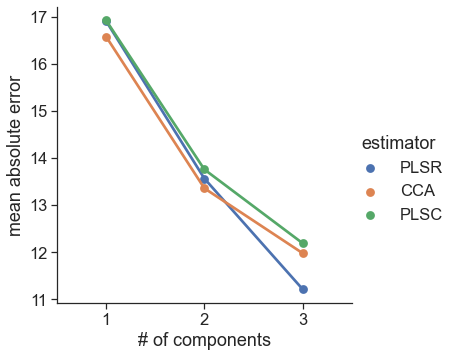

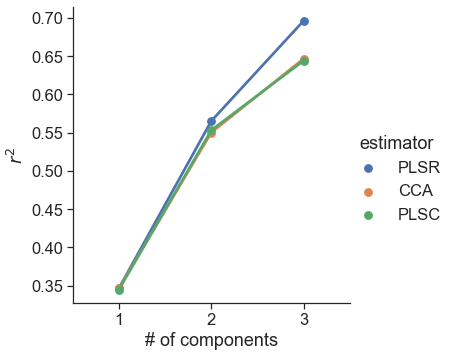

In [18]:
sns.set(font_scale=1.5)
sns.set_style('ticks')

sns.catplot(x = 'nc', y='mae', hue = 'estimator', 
               data=nc_chooser,aspect=1,kind='point')
plt.ylabel('mean absolute error')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_mae_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

sns.catplot(x = 'nc', y='r2', hue = 'estimator', 
               data=nc_chooser[nc_chooser.nc<5],
               aspect=1,kind='point')
plt.ylabel('$r^{2}$')
plt.xlabel('# of components')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/estimator_selection_cv_r2_rkf.pdf', 
#             bbox_inches='tight')
plt.show()

#### Cross-validation w/ bootstrapping for CIs

In [19]:
from sklearn.cross_decomposition import PLSCanonical, PLSSVD
from sklearn.model_selection import KFold

ncs = 3
nc_chooser = pandas.DataFrame(index = range(ncs*3), 
                              columns = ['nc', 'estimator', 
                                         'r2','mae'])
i=0
for k,nc in enumerate(range(1,ncs+1)):
    print(nc)
    estimators = {'PLSR': PLSRegression(n_components=nc), 
                  'CCA': CCA(n_components=nc),
                 'PLSC': PLSCanonical(n_components=nc)}
#    nc_chooser.loc[k*3:k*3+2,'nc'] = [nc]*3
    for lab, estimator in estimators.items():
        for it in range(100):
            nind = np.random.choice(tr.index,len(tr.index))
            pred = cross_val_predict(estimator, tr.loc[nind],
                                     tr_y.loc[nind],
                                    groups = gdf.loc[nind].slab_type, 
                                     cv=10)
            nc_chooser.loc[i, 'r2'] = r2_score(y_true=tr_y.loc[nind],
                                               y_pred=pred)
            nc_chooser.loc[i, 'mae'] = mean_absolute_error(y_true=tr_y.loc[nind],
                                                           y_pred=pred)
            nc_chooser.loc[i, 'estimator'] = lab
            nc_chooser.loc[i,'nc'] = nc
            nc_chooser.loc[i,'iter'] = it
            i+=1

1
2
3


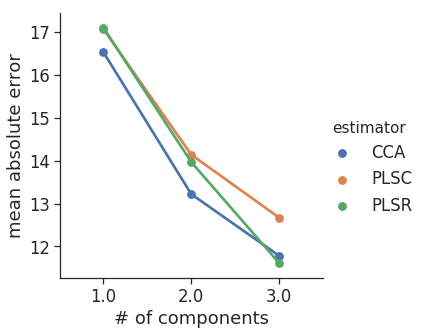

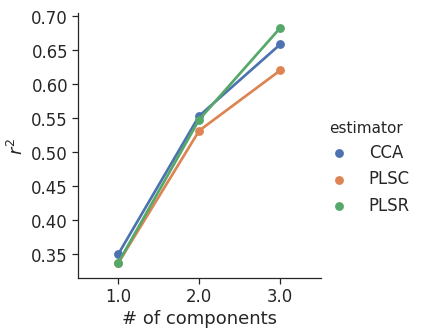

In [20]:
sns.set(font_scale=1.5)
sns.set_style('ticks')

sns.catplot(x = 'nc', y='mae', hue = 'estimator', 
               data=nc_chooser,aspect=1,kind='point')
plt.ylabel('mean absolute error')
plt.xlabel('# of components')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/estimator_selection_cv_mae_bs_100.pdf', 
           bbox_inches='tight')
plt.show()

sns.catplot(x = 'nc', y='r2', hue = 'estimator', 
               data=nc_chooser[nc_chooser.nc<5],
               aspect=1,kind='point')
plt.ylabel('$r^{2}$')
plt.xlabel('# of components')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/estimator_selection_cv_r2_bs_100.pdf', 
            bbox_inches='tight')
plt.show()

In [22]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)

PLSRegression(copy=True, max_iter=500, n_components=3, scale=True, tol=1e-06)

In [62]:
# from importlib import reload
# reload(XD)

In [128]:
# results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y, n_iterations=1000,
#                                           metric=mean_absolute_error)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


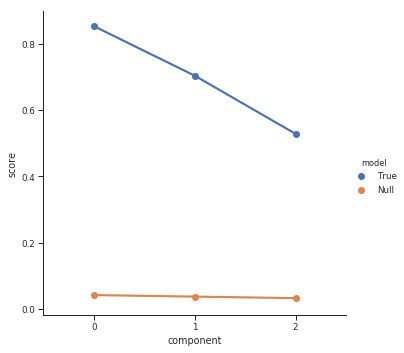

component 0: p = 0.001  ***
component 1: p = 0.001  ***
component 2: p = 0.001  ***


In [63]:
results, comp_sig = XD.evaluate_components(pls_mod, tr, tr_y, n_iterations=1000)

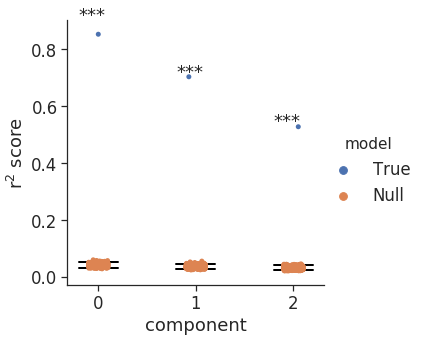

In [64]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
sns.catplot(x='component', y='score', hue='model', data=results)
plt.text(-0.20,0.9,'***')
plt.text(0.80,0.7,'***')
plt.text(1.80,0.53,'***')
plt.ylabel('r$^2$ score')
for c in range(len(results.component.unique())):
    cvals = results[(results.model=='Null')&(results.component==c)
                ].score.sort_values().values
    cmin = cvals[25]
    cmax = cvals[975]
    plt.plot([c-.2,c+.2],[cmin,cmin],lw=2,c='black')
    plt.plot([c-.2,c+.2],[cmax,cmax],lw=2,c='black')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/sig_componentsTR.pdf',
#              bbox_inches='tight')

# Evaluate model

In [100]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(tr,tr_y)

PLSRegression(n_components=3)

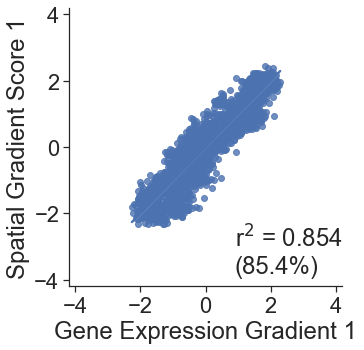

r2 = 0.8536305903100612, percent of total = 0.8536305903100612


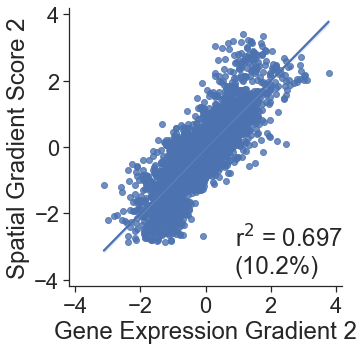

r2 = 0.6969288711885941, percent of total = 0.10200906747174994


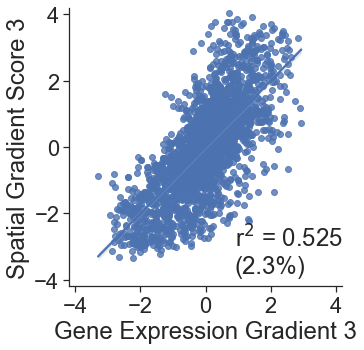

r2 = 0.5247844536368539, percent of total = 0.023279617954116122


In [118]:
# plot component scores
sns.set_context('notebook',font_scale=2)
total = 1
leftover = 1
for i in range(pls_mod.n_components):
    r2 = stats.pearsonr(pls_mod.x_scores_[:,i], pls_mod.y_scores_[:,i])[0]**2
    explained = (leftover * r2)
    exp_perc = explained * 100
    plt.close()
    plotr = pandas.concat([pandas.Series(pls_mod.x_scores_[:,i]),
                          pandas.Series(pls_mod.y_scores_[:,i])],
                         axis=1)
    plotr.columns = ['x','y']
    g=sns.lmplot(x='x', y='y',data=plotr)
    plt.xlim(-4.2,4.2)
    plt.ylim(-4.2,4.2)
    g.set(xticks=[-4,-2,0,2,4])
    plt.xlabel('Gene Expression Gradient %i'%(i+1))
    plt.ylabel('Spatial Gradient Score %i'%(i+1))
    plt.text(.9,-3.8,'r$^2$ = %s \n(%s%%)'%(round(r2,3),round(exp_perc,1)))
    plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/principal_correlation_%s.pdf'%i,
               bbox_inches='tight')
    plt.show()
    print('r2 = %s, percent of total = %s'%(r2, explained))
    leftover -= explained


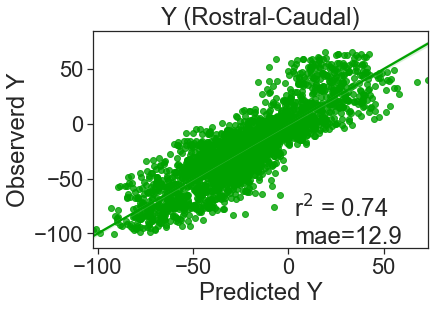

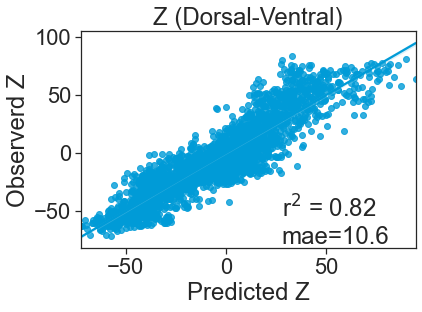

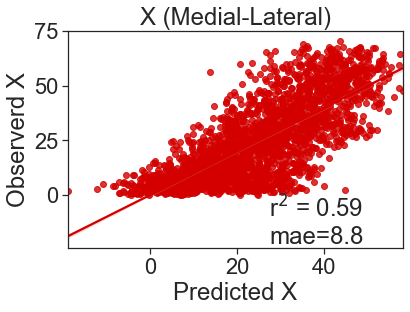

In [174]:
# plot model fit
pred = pls_mod.predict(tr)
labs = dict(zip(['Y','Z','X'],
                ['Rostral-Caudal',
                  'Dorsal-Ventral',
                  'Medial-Lateral']))

for i in range(tr_y.shape[-1]):
    fig = plt.figure(figsize=(6,4))
    ax = fig.add_subplot(111)
    label = tr_y.columns[i][-1].upper()
    sns.regplot(x=pred[:,i], y=tr_y[tr_y.columns[i]],
                #color = colos[label]
               )
    plt.title('%s (%s)'%(label,labs[label]))
    plt.xlabel('Predicted %s'%label)
    plt.ylabel('Observerd %s'%label)
    
#     tx = np.max(pred[:,i]) - np.min(pred[:,i]) * .4
#     tx = np.min(pred[:,i]) + tx
#     ty = np.max(tr_y[tr_y.columns[i]]
#                ) -np.min(tr_y[tr_y.columns[i]]) * -.5
#     ty = np.min(tr_y[tr_y.columns[i]]) + ty
    r2 = stats.pearsonr(pred[:,i], tr_y[tr_y.columns[i]])[0]**2
    mae = mean_absolute_error(pred[:,i], tr_y[tr_y.columns[i]])
    plt.text(0.6,0.02,
             'r$^2$ = %s \nmae=%s'%(round(r2,2),round(mae,1)),
            transform=ax.transAxes)
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/TestRes_%s.pdf'%label,
#                bbox_inches='tight')
    plt.show()


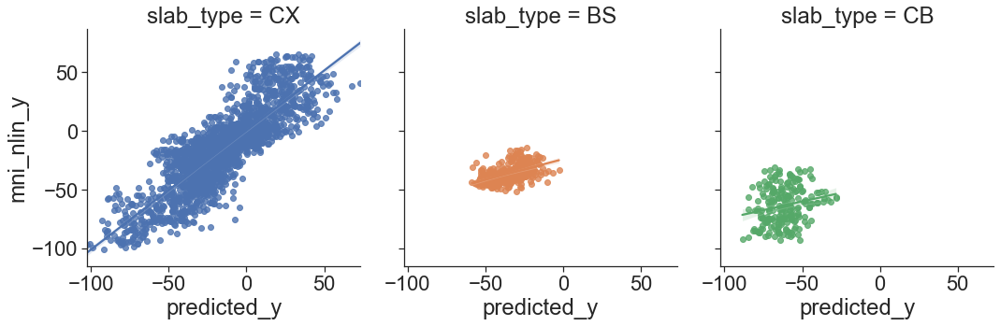

CX r2 =0.7147103895041136
CX mae =13.731615251655333
BS r2 =0.26180080592732274
BS mae =7.33492128560158
CB r2 =0.04477004819290034
CB mae =14.735364564585405


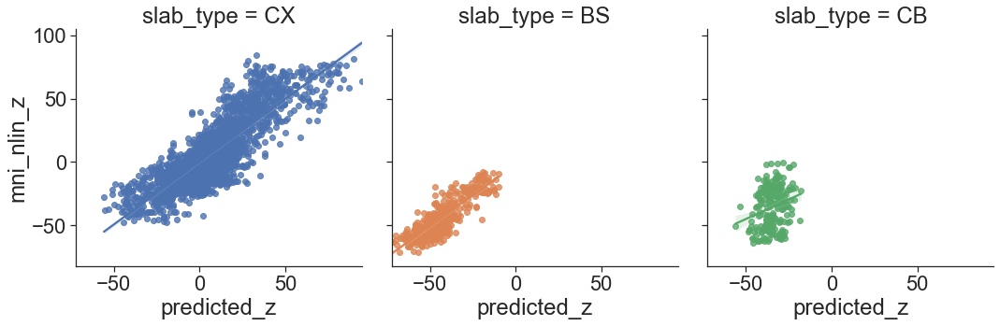

CX r2 =0.72501509572994
CX mae =11.064288544979279
BS r2 =0.7405010678602721
BS mae =6.494937600605595
CB r2 =0.06244208758350499
CB mae =13.365140956067272


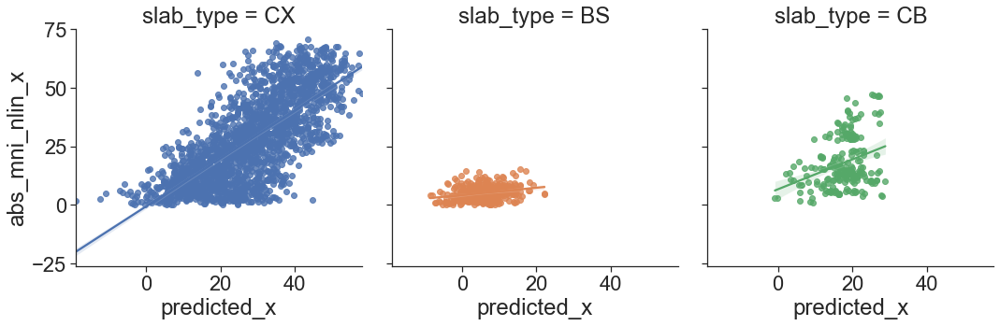

CX r2 =0.5256713738152858
CX mae =9.6612376736063
BS r2 =0.07425880793357427
BS mae =4.269763938819753
CB r2 =0.1064383031649988
CB mae =8.806999195672992


In [120]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(pred, index=tr_y.index), tr_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z','predicted_x'] + tr_y.columns.tolist()
preds_df.loc[:,'slab_type'] = gdf.loc[tr.index,'slab_type']
n_components = tr_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], 
               col = 'slab_type', data = preds_df,hue='slab_type')
    #plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        if not pandas.notnull(slab):
            continue
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+n_components]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

# Test model

In [175]:
pal=sns.color_palette('nipy_spectral',n_colors=12)
colos = dict(zip(['Y','Z','X'],
                [pal[5],pal[3],pal[-1]]
                ))
pal

[(0.4993470588235294, 0.0, 0.5659960784313726),
 (0.0, 0.0, 0.6784647058823529),
 (0.0, 0.2928313725490196, 0.8667),
 (0.0, 0.6078470588235294, 0.8431705882352941),
 (0.0, 0.6667, 0.575150980392157),
 (0.0, 0.633978431372549, 0.0),
 (0.0, 0.8326960784313726, 0.0),
 (0.2300549019607843, 1.0, 0.0),
 (0.9097705882352941, 0.9411470588235294, 0.0),
 (1.0, 0.7254901960784318, 0.0),
 (1.0, 0.03529411764705881, 0.0),
 (0.8326960784313726, 0.0, 0.0)]

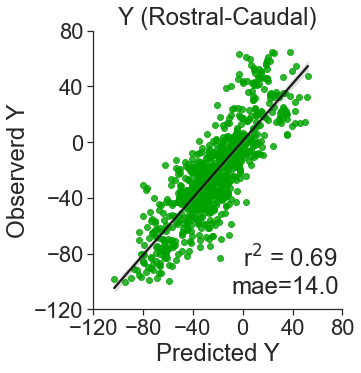

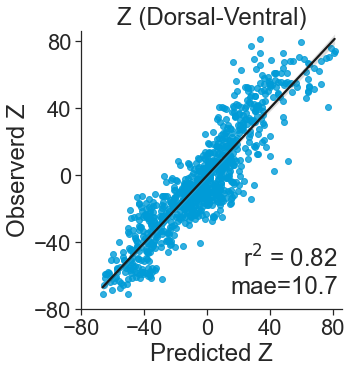

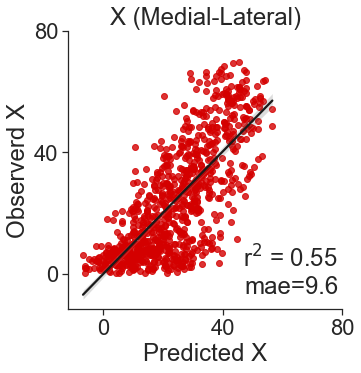

In [180]:
# plot model fit
dims = ['Y','Z','X']
labs = dict(zip(dims,['Rostral-Caudal',
                      'Dorsal-Ventral',
                      'Medial-Lateral']))
te_pred = pls_mod.predict(te)
for i in range(te_y.shape[-1]):
#     fig = plt.figure(figsize=(6,4))
#     ax = fig.add_subplot(111)
    label = te_y.columns[i][-1].upper()
    plotr = pandas.concat([pandas.Series(te_pred[:,i]),
                          pandas.Series(te_y[te_y.columns[i]].values)],
                         axis=1)
    plotr.columns = ['x','y']
    g=sns.lmplot(x='x', y='y',data=plotr,
                 scatter_kws={'color':colos[label]},
                 line_kws={'color':'k'}
                )
    pmax = np.max(plotr.max().values)
    pmin = np.min(plotr.min().values)
    incr = 40
    tmin = int(round((pmin/incr))*incr)
    tmax = int(round((pmax/incr))*incr) + 1
    trange = list(range(tmin,tmax,incr))
    plt.title('%s (%s)'%(label,labs[label]))
    plt.xlabel('Predicted %s'%label)
    plt.ylabel('Observerd %s'%label)
    plt.xlim(pmin-5,pmax+5)
    plt.ylim(pmin-5,pmax+5)
    g.set(xticks=trange,yticks=trange)
    r2 = stats.pearsonr(te_pred[:,i], te_y[te_y.columns[i]])[0]**2
    mae = mean_absolute_error(te_pred[:,i], te_y[te_y.columns[i]])
    plt.text(0.85,0.2,
             'r$^2$ = %s \nmae=%s'%(round(r2,2),round(mae,1)),
            transform=ax.transAxes,horizontalalignment='right')
    plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/TestRes_%s.pdf'%label,
               bbox_inches='tight')
    plt.show()


In [153]:
422/200

2.11

In [155]:
4/2.11

1.2796208530805688

In [158]:
6.7679/2.11

3.207535545023697

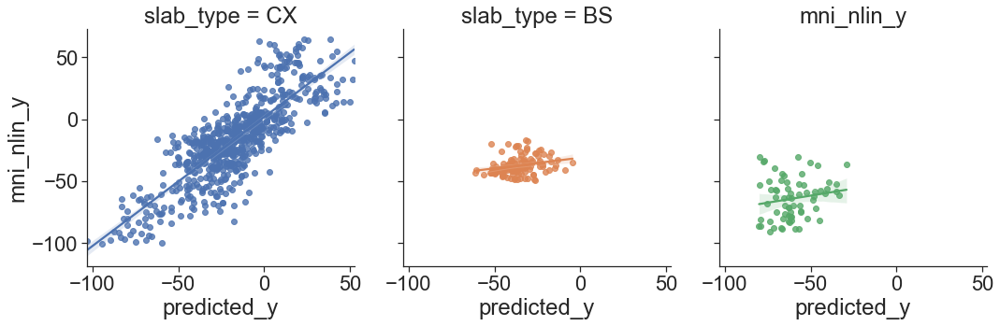

CX r2 =0.6704951141177633
CX mae =14.7056162909063
BS r2 =0.06232205475443154
BS mae =9.132789166407907
CB r2 =0.02859952657360246
CB mae =15.970188816891092


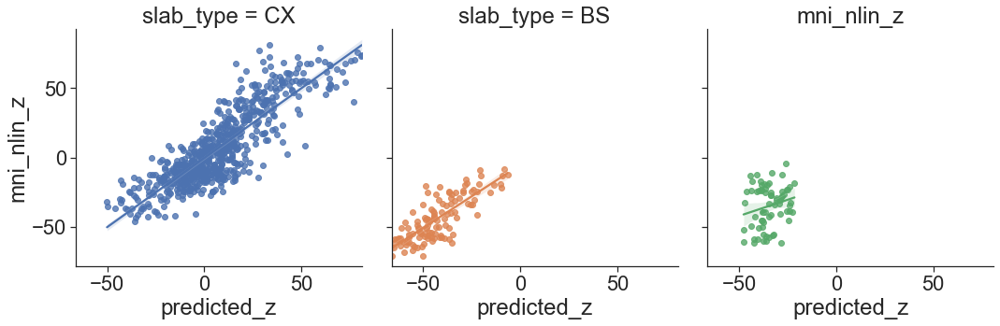

CX r2 =0.7287545017369509
CX mae =10.978404393042046
BS r2 =0.6322836599909497
BS mae =7.721480020428863
CB r2 =0.04356886107504932
CB mae =12.434931631259548


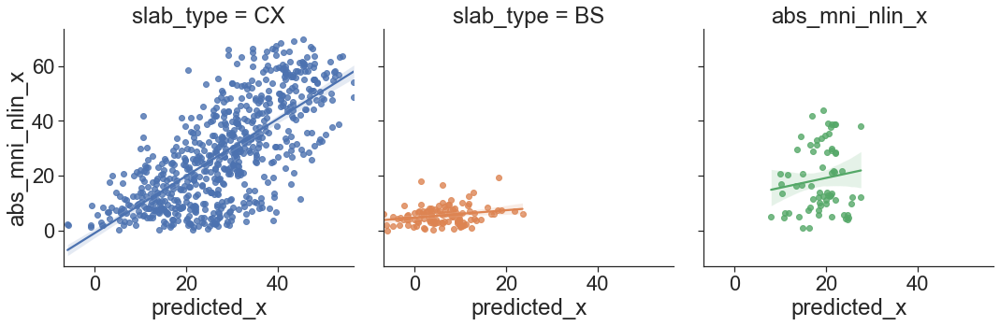

CX r2 =0.4906147318376318
CX mae =10.356870442077579
BS r2 =0.055959332510977636
BS mae =4.908528768711483
CB r2 =0.016997898595336937
CB mae =10.629101994790528


In [36]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(te_pred, index=te_y.index), te_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z', 'predicted_x'] + te_y.columns.tolist()
preds_df.loc[:,'slab_type'] = gdf.loc[te.index,'slab_type']
n_components = te_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], hue = 'slab_type', 
               col = 'slab_type', data = preds_df)
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/%s_by_slabtype.pdf'%preds_df.columns[i],
#               bbox_inches = 'tight')
    plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+n_components]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

In [18]:
pls_mod = PLSRegression(n_components=3)
full_y = gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(n_components=3)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


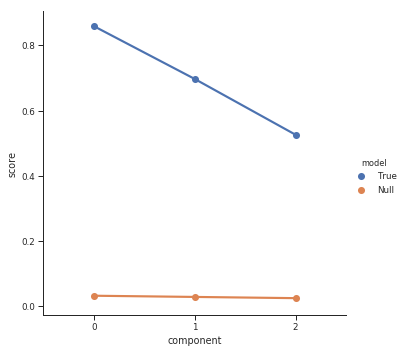

component 0: p = 0.001  ***
component 1: p = 0.001  ***
component 2: p = 0.001  ***


In [72]:
# significant components?
results, comp_sig = XD.evaluate_components(pls_mod, pca_tfm, full_y, n_iterations=1000)

/home/users/jvogel/gxp/lib/python3.5/site-packages/seaborn/categorical.py:3672: UserWarning:

The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.



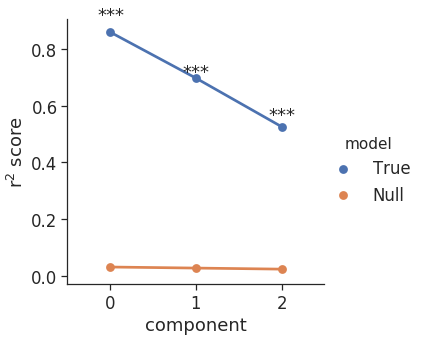

In [73]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
sns.factorplot(x='component', y='score', hue='model', data=results)
plt.text(-0.15,0.9,'***')
plt.text(0.85,0.7,'***')
plt.text(1.85,0.55,'***')
plt.ylabel('r$^2$ score')
#plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/figs/FULLMOD_sig_components.pdf',
#            bbox_inches='tight')
plt.show()

# Build and evaluate model on all data

In [17]:
pls_mod = PLSRegression(n_components=3)
full_y = gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

PLSRegression(n_components=3)

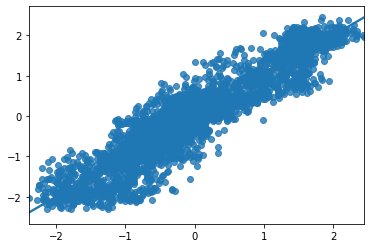

r2 = 0.8580971406133977, percent of total = 0.8580971406133977


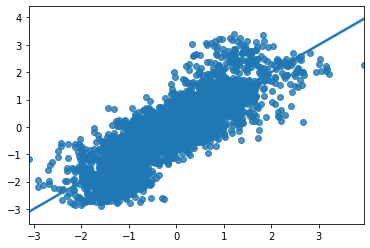

r2 = 0.6943964879443661, percent of total = 0.09853684718731986


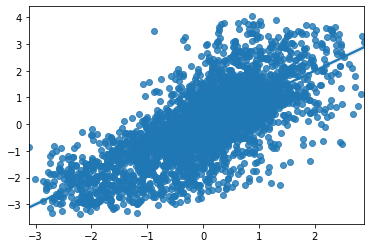

r2 = 0.5189480282476112, percent of total = 0.022504706523779474


In [18]:
pls_mod.fit(pca_tfm, gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']])
# plot component scores
total = 1
leftover = 1
for i in range(pls_mod.n_components):
    plt.close()
    sns.regplot(x=pls_mod.x_scores_[:,i], y=pls_mod.y_scores_[:,i])
    plt.show()
    r2 = stats.pearsonr(pls_mod.x_scores_[:,i], pls_mod.y_scores_[:,i])[0]**2
    explained = leftover * r2
    print('r2 = %s, percent of total = %s'%(r2, explained))
    leftover = leftover - explained

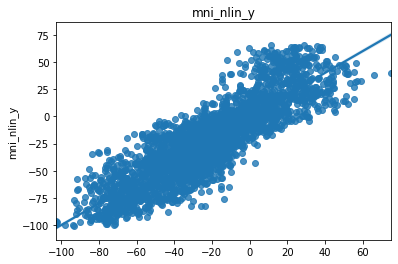

(0.8579636339168611, 0.0)
13.02675813866063


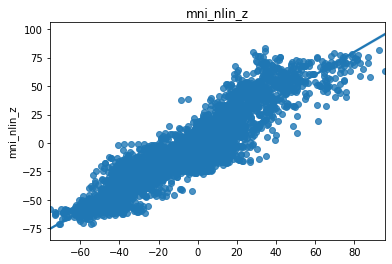

(0.9070769584303928, 0.0)
10.408928028511152


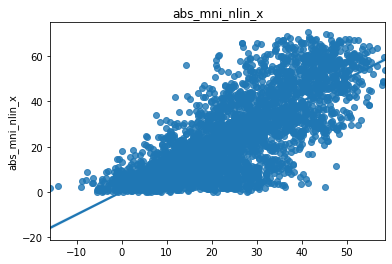

(0.7678362801181763, 0.0)
8.900014489046107


In [19]:
# plot model fit
pred = pls_mod.predict(pca_tfm)
for i in range(full_y.shape[-1]):
    plt.close()
    sns.regplot(x=pred[:,i], y=full_y[full_y.columns[i]])
    plt.title(full_y.columns[i])
    plt.show()
    print(stats.pearsonr(pred[:,i], full_y[full_y.columns[i]]))
    print(mean_absolute_error(pred[:,i], full_y[full_y.columns[i]]))

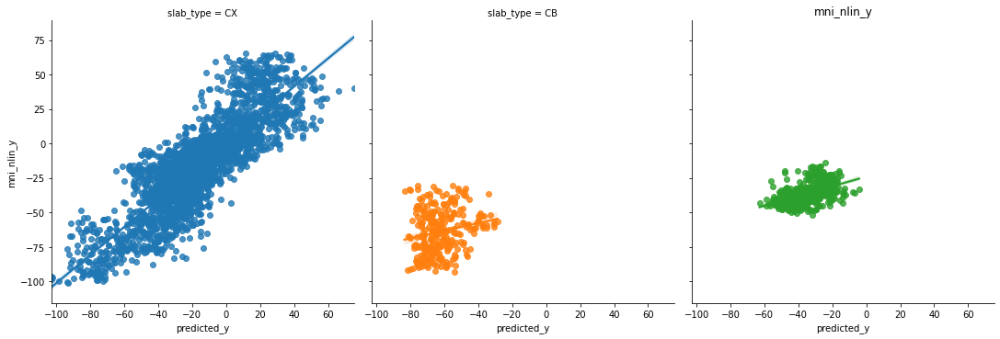

CX r2 =0.7106241314228845
CX mae =46.98086819526874
CB r2 =0.03870175791905407
CB mae =80.14190560176615
BS r2 =0.25850737198151424
BS mae =41.43407773198498


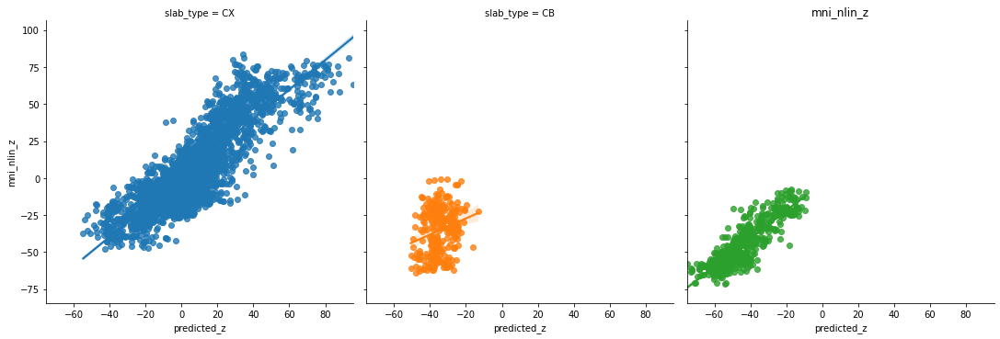

CX r2 =0.7350358003127031
CX mae =36.77293335570408
CB r2 =0.05335263420632493
CB mae =29.127736723196605
BS r2 =0.7428100735011182
BS mae =10.865964462805191


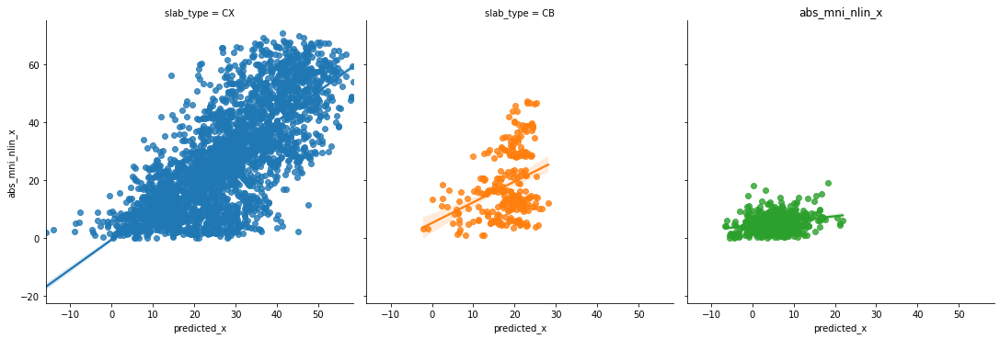

CX r2 =0.5206717744931207
CX mae =30.577209438645077
CB r2 =0.11521829615651849
CB mae =53.39861404465251
BS r2 =0.06519586202101846
BS mae =48.86721671139611


In [20]:
# plot fit by slab type
preds_df = pandas.concat([pandas.DataFrame(pred, index=full_y.index), full_y],axis=1)
preds_df.columns = ['predicted_y', 'predicted_z', 'predicted_x'] + full_y.columns.tolist()
preds_df.loc[:,'slab_type'] = gdf.loc[pca_tfm.index,'slab_type']
n_components = full_y.shape[-1]
for i in range(n_components):
    plt.close()
    sns.lmplot(x=preds_df.columns[i], y = preds_df.columns[i+n_components], 
               col = 'slab_type', data = preds_df, hue='slab_type')
    plt.title(preds_df.columns[i+n_components])
    plt.show()
    for slab in preds_df.slab_type.unique():
        r2 = stats.pearsonr(preds_df[preds_df.slab_type==slab][preds_df.columns[i]],
                           preds_df[preds_df.slab_type==slab][preds_df.columns[i+n_components]]
                           )[0]**2
        mae = mean_absolute_error(preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i]],
                                  preds_df[preds_df.slab_type==slab
                                          ][preds_df.columns[i+2]])
        print('%s r2 =%s'%(slab,r2))
        print('%s mae =%s'%(slab,mae))

# Visualize predictions

In [21]:
preds_df.loc[:,'structure'] = gdf.structure_acronym.values

In [22]:
g2=pandas.read_csv('/Users/jacobv/Science/PLS_GXP/txfer/MAIN_gcx_wholebrain_info_W_BRAIN_DIVISIONS.csv',
                  index_col=0)

In [23]:
g2 = g2.loc[gdf[gdf.columns[0]].values]

In [24]:
bd2 = ['Temporal' if x == 'Limbic' else\
      'Subcortex' if x in ['Thalamus','Striatum',
                           'Hypothalamus','Forebrain',
                           'Other_Dien'] else\
      'Brainstem' if x in ['Medulla','Pons',
                           'Tegmentum','Tectum'] else\
      'Frontal' if x in ['Anterior_Cingulate','Insula'] else\
      'Parietal' if x == 'Posterior_Cingulate' else\
      'Cerebellum' if x == 'DCN' else\
      x for x in g2.brain_divison.values]
g2.loc[:,'BD2'] = bd2

/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


(-115.0, 75.0)

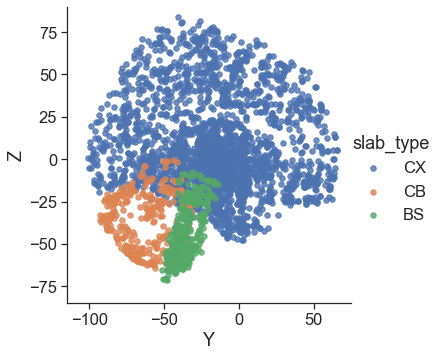

In [23]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot('mni_nlin_y', 'mni_nlin_z', hue = 'slab_type', data=gdf, fit_reg=False, 
           scatter_kws={"s": 30})
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ.pdf',
#            bbox_inches='tight')

(-115.0, 75.0)

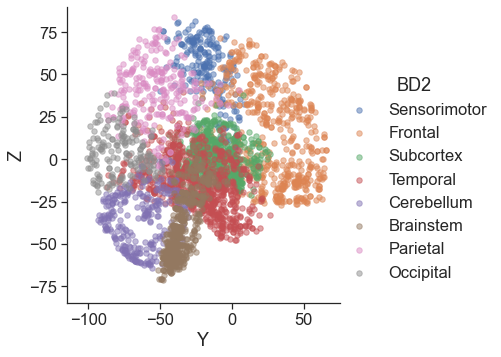

In [25]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot(x='mni_nlin_y',y='mni_nlin_z', hue = 'BD2', data=g2, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_div.pdf',
#            bbox_inches='tight')

Text(58.37693064236113, 0.5, 'Z')

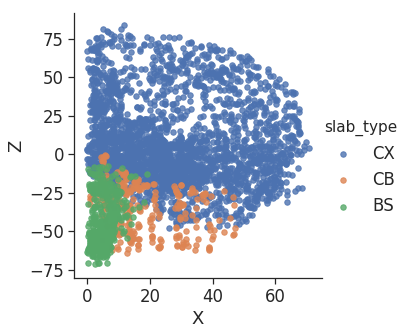

In [87]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', hue = 'slab_type', data=gdf, fit_reg=False, 
           scatter_kws={"s": 30})
plt.xlabel('X')
plt.ylabel('Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ.pdf',
#            bbox_inches='tight')

Text(78.36078684895834, 0.5, 'Z')

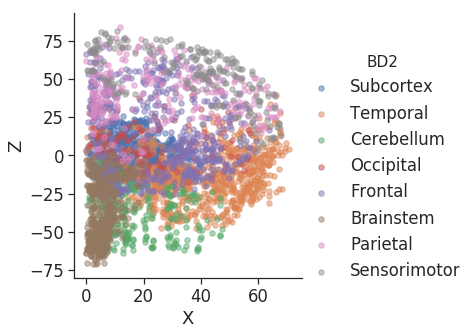

In [88]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', hue = 'BD2', data=g2, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('X')
plt.ylabel('Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ_div.pdf',
#            bbox_inches='tight')

(-115.0, 75.0)

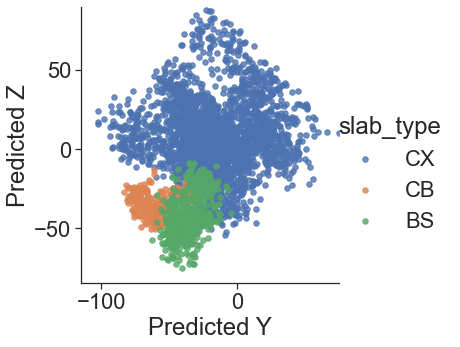

In [51]:
sns.lmplot(x='predicted_y', y='predicted_z', hue = 'slab_type', 
           data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred.pdf',
#            bbox_inches='tight')

In [54]:
preds_df.loc[:,'BD2'] = bd2

(-115.0, 75.0)

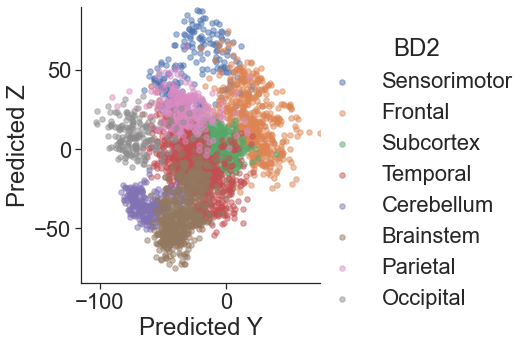

In [55]:
sns.lmplot(x='predicted_y', y='predicted_z', hue = 'BD2', data=preds_df, 
           fit_reg=False, 
           scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Predicted Y')
plt.ylabel('Predicted Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_YZ_pred_div.pdf',
#            bbox_inches='tight')

Text(58.37693064236113, 0.5, 'Predicted Z')

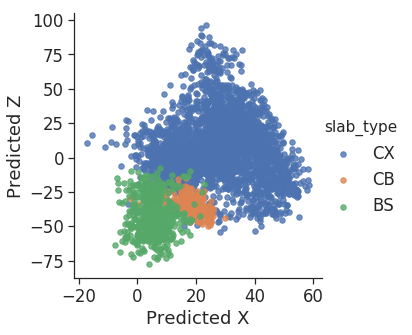

In [92]:
sns.lmplot('predicted_x', 'predicted_z', hue = 'slab_type', data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted X')
plt.ylabel('Predicted Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ_pred.pdf',
#            bbox_inches='tight')

Text(78.36078684895834, 0.5, 'Predicted Z')

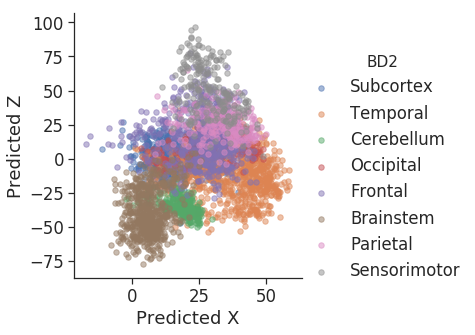

In [93]:
sns.lmplot('predicted_x', 'predicted_z', hue = 'BD2', data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30,'alpha':0.5})
plt.xlabel('Predicted X')
plt.ylabel('Predicted Z')
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_XZ_pred_div.pdf',
#            bbox_inches='tight')

In [192]:
preds_df.loc[:,'error_y'] = abs(preds_df.predicted_y.values -\
                                preds_df.mni_nlin_y.values)
preds_df.loc[:,'error_z'] = abs(preds_df.predicted_z.values -\
                                preds_df.mni_nlin_z.values)
preds_df.loc[:,'error_x'] = abs(preds_df.predicted_x.values -\
                                preds_df.abs_mni_nlin_x.values)
preds_df.loc[:,'total_error'] = preds_df[['error_y',
                                          'error_z',
                                          'error_x']].mean(1).values
ecols = [x for x in preds_df.columns if 'error' in x]
for ecol in ecols:
    cut = pandas.cut(preds_df[ecol],10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    preds_df.loc[:,'%s_cat'%ecol] = [code[x] for x in cut]

In [63]:
code

{Interval(0.111, 4.274, closed='right'): 1,
 Interval(4.274, 8.395, closed='right'): 2,
 Interval(8.395, 12.516, closed='right'): 3,
 Interval(12.516, 16.638, closed='right'): 4,
 Interval(16.638, 20.759, closed='right'): 5,
 Interval(20.759, 24.881, closed='right'): 6,
 Interval(24.881, 29.002, closed='right'): 7,
 Interval(29.002, 33.124, closed='right'): 8,
 Interval(33.124, 37.245, closed='right'): 9,
 Interval(37.245, 41.366, closed='right'): 10}

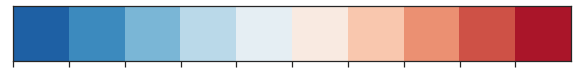

In [64]:
sns.palplot(sns.color_palette('RdBu_r',10))
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_error_colors.pdf',
            bbox_inches='tight')

/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


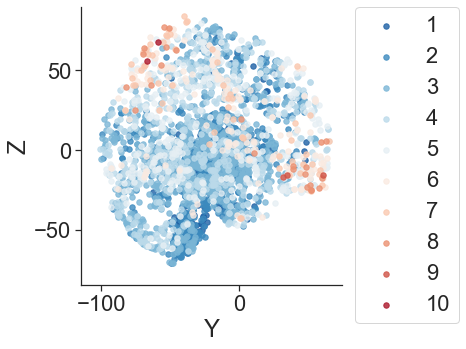

In [65]:
sns.lmplot(z='mni_nlin_y', y='mni_nlin_z', 
           hue = 'total_error_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_error_YZ.pdf',
#             bbox_inches='tight')

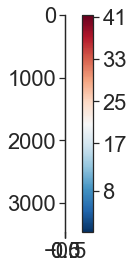

In [257]:
fig, ax = plt.subplots()
cax = ax.imshow(preds_df.total_error.values.reshape(-1,1), 
                interpolation='none', cmap='RdBu_r')
cbar = fig.colorbar(cax)
cbar.set_ticks(newticks)

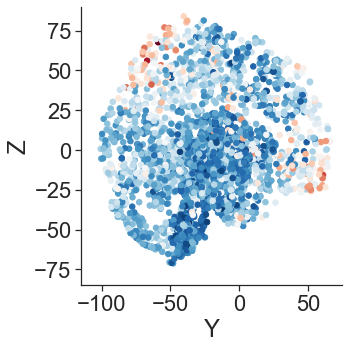

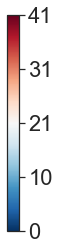

In [265]:
import matplotlib.colors
cmap = sns.color_palette('RdBu_r',as_cmap=True)
norm = matplotlib.colors.Normalize(vmin=preds_df.total_error.min(), 
                                   vmax=preds_df.total_error.max())
cscale = cmap(norm(preds_df.total_error.values))

g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z', 
              legend=True, 
               data=preds_df, fit_reg=False, 
               scatter_kws={"s": 30,'color':cscale},
              palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.ylim(-85,90)
plt.xlim(-115,75)
plt.xticks([-100,-50,0,50])
plt.yticks(list(range(-75,76,25)))
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_error_YZ.pdf',
            bbox_inches='tight')

# colorbar
a = np.array([[0,1]])
plt.figure(figsize=(.2, 5))
img = plt.imshow(a, cmap="RdBu_r")
plt.gca().set_visible(False)
cax = plt.axes([0.1, 0.2, 0.8, 0.6])
cbar = plt.colorbar(orientation="vertical", cax=cax)
newticks = [int(round(norm.inverse(x))) for x in cbar.get_ticks()]
cbar.set_ticks(cbar.get_ticks())
cbar.set_ticklabels(newticks)
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_error_YZ_cbar.pdf',
            bbox_inches='tight')




In [266]:
# code

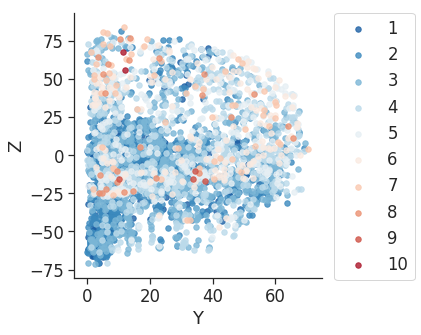

In [101]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', 
           hue = 'total_error_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/brain_plot_error_XZ.pdf',
#             bbox_inches='tight')

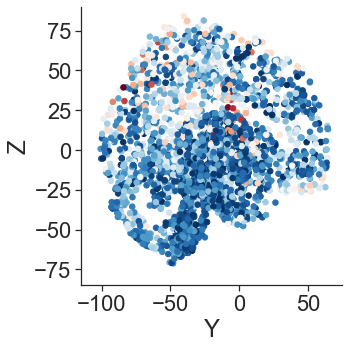

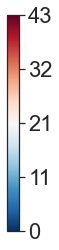

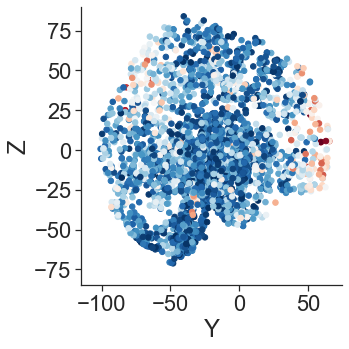

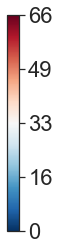

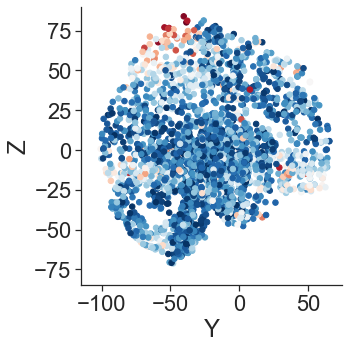

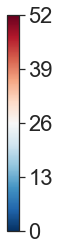

In [269]:
cmap = sns.color_palette('RdBu_r',as_cmap=True)

for col in ['error_x','error_y','error_z']:
    c = col[-1].upper()
    norm = matplotlib.colors.Normalize(vmin=preds_df[col].min(), 
                                       vmax=preds_df[col].max())
    cscale = cmap(norm(preds_df[col].values))

    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z', 
                  legend=True, 
                   data=preds_df, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.ylim(-85,90)
    plt.xlim(-115,75)
    plt.xticks([-100,-50,0,50])
    plt.yticks(list(range(-75,76,25)))
    plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_%serror_YZ.pdf'%c,
               bbox_inches='tight')

    # colorbar
    a = np.array([[0,1]])
    plt.figure(figsize=(.2, 5))
    img = plt.imshow(a, cmap="RdBu_r")
    plt.gca().set_visible(False)
    cax = plt.axes([0.1, 0.2, 0.8, 0.6])
    cbar = plt.colorbar(orientation="vertical", cax=cax)
    newticks = [int(round(norm.inverse(x))) for x in cbar.get_ticks()]
    cbar.set_ticks(cbar.get_ticks())
    cbar.set_ticklabels(newticks)
    plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_%serror_YZ_cbar.pdf'%c,
               bbox_inches='tight')
    
    plt.show()




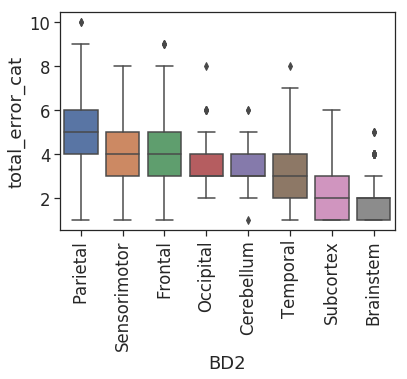

In [52]:
order = pandas.pivot_table(preds_df,index='BD2',
                           values='total_error_cat'
                          ).sort_values('total_error_cat',
                                        ascending=False).index
g = sns.boxplot(x='BD2',y='total_error_cat',data=preds_df,order=order)
g.set_xticklabels(g.get_xticklabels(),rotation=90)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain_plot_error_by_region.pdf',
            bbox_inches='tight')

In [71]:
ecol = 'error_x'
cut = pandas.cut(preds_df[ecol],10)
code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
code

{Interval(-0.0404, 4.297, closed='right'): 1,
 Interval(4.297, 8.591, closed='right'): 2,
 Interval(8.591, 12.885, closed='right'): 3,
 Interval(12.885, 17.179, closed='right'): 4,
 Interval(17.179, 21.473, closed='right'): 5,
 Interval(21.473, 25.767, closed='right'): 6,
 Interval(25.767, 30.061, closed='right'): 7,
 Interval(30.061, 34.355, closed='right'): 8,
 Interval(34.355, 38.649, closed='right'): 9,
 Interval(38.649, 42.943, closed='right'): 10}

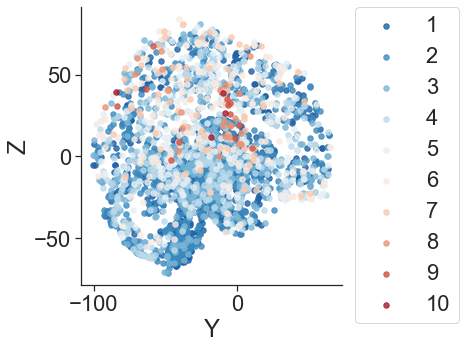

In [68]:
sns.lmplot(x='mni_nlin_y', y='mni_nlin_z', 
           hue = 'error_x_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_Xerror_YZ.pdf',
#            bbox_inches='tight')

In [72]:
ecol = 'error_y'
cut = pandas.cut(preds_df[ecol],10)
code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
code

{Interval(-0.0642, 6.58, closed='right'): 1,
 Interval(6.58, 13.159, closed='right'): 2,
 Interval(13.159, 19.738, closed='right'): 3,
 Interval(19.738, 26.316, closed='right'): 4,
 Interval(26.316, 32.895, closed='right'): 5,
 Interval(32.895, 39.474, closed='right'): 6,
 Interval(39.474, 46.052, closed='right'): 7,
 Interval(46.052, 52.631, closed='right'): 8,
 Interval(52.631, 59.21, closed='right'): 9,
 Interval(59.21, 65.788, closed='right'): 10}

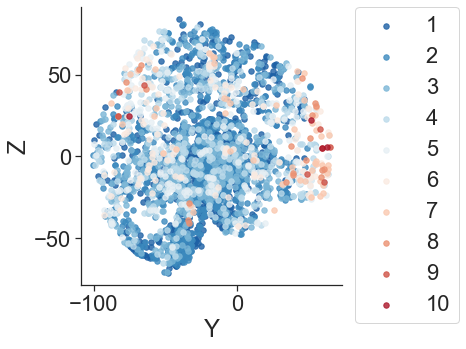

In [69]:
sns.lmplot(x='mni_nlin_y', y='mni_nlin_z', 
           hue = 'error_y_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_Yerror_YZ.pdf',
           bbox_inches='tight')

In [73]:
ecol = 'error_z'
cut = pandas.cut(preds_df[ecol],10)
code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
code

{Interval(-0.043, 5.177, closed='right'): 1,
 Interval(5.177, 10.346, closed='right'): 2,
 Interval(10.346, 15.515, closed='right'): 3,
 Interval(15.515, 20.684, closed='right'): 4,
 Interval(20.684, 25.853, closed='right'): 5,
 Interval(25.853, 31.021, closed='right'): 6,
 Interval(31.021, 36.19, closed='right'): 7,
 Interval(36.19, 41.359, closed='right'): 8,
 Interval(41.359, 46.528, closed='right'): 9,
 Interval(46.528, 51.696, closed='right'): 10}

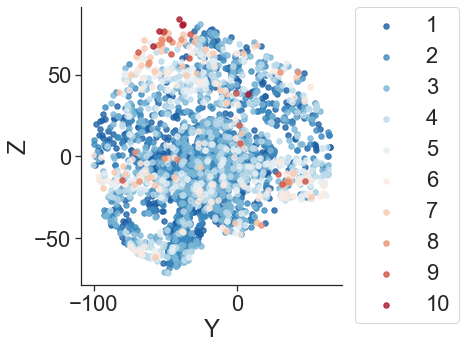

In [70]:
sns.lmplot(x='mni_nlin_y', y='mni_nlin_z', 
           hue = 'error_z_cat',legend=False, 
           data=preds_df, fit_reg=False, 
           scatter_kws={"s": 30},
          palette='RdBu_r')
plt.xlabel('Y')
plt.ylabel('Z')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_Zerror_YZ.pdf',
           bbox_inches='tight')

In [80]:
# is extremity or distance from center related to error?

# extremity
from scipy.spatial.distance import cdist
distmat = cdist(full_y.round(4).values,full_y.round(4).values)
dm = pandas.DataFrame(distmat)

preds_df.loc[:,'extremity'] = dm.mean(1).values

# distance from center
preds_df.loc[:,'abs_mni_nlin_y'] = preds_df.mni_nlin_y.abs().values
preds_df.loc[:,'abs_mni_nlin_z'] = preds_df.mni_nlin_z.abs().values
preds_df.loc[:,'center_dist'] = preds_df[['abs_mni_nlin_x','abs_mni_nlin_y',
                               'abs_mni_nlin_z']].mean(1).values

In [ ]:
preds_df.total_error

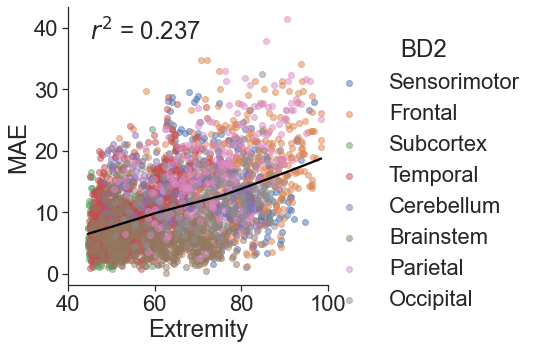

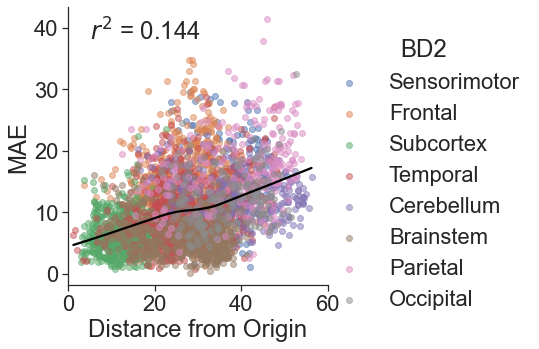

In [99]:
r2 = stats.pearsonr(preds_df.extremity,preds_df.total_error)[0]**2
sns.lmplot(x='extremity',y='total_error',data=preds_df,
          fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
sns.regplot(x='extremity',y='total_error',data=preds_df,
          color='black',marker='',lowess=True)
plt.xlabel('Extremity')
plt.ylabel('MAE')
plt.xlim(40,100)
plt.text(45,38,'$r^{2}$ = %s'%round(r2,3))
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/ErrVExtremity.pdf',
           bbox_inches='tight')
plt.show()

r2 = stats.pearsonr(preds_df.center_dist,preds_df.total_error)[0]**2
sns.lmplot(x='center_dist',y='total_error',data=preds_df, 
          fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
sns.regplot(x='center_dist',y='total_error',data=preds_df,
         lowess=True,color='black',marker='')
plt.xlabel('Distance from Origin')
plt.ylabel('MAE')
plt.xlim(0,60)
plt.text(5,38,'$r^{2}$ = %s'%round(r2,3))
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/ErrVCenterDist.pdf',
           bbox_inches='tight')
plt.show()

# sns.lmplot(x='abs_mni_nlin_x',y='error_x',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_x',y='error_x',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

# sns.lmplot(x='abs_mni_nlin_y',y='error_y',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_y',y='error_y',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

# sns.lmplot(x='abs_mni_nlin_z',y='error_z',data=preds_df, 
#           fit_reg=False,hue='BD2',scatter_kws={'alpha':0.5})
# sns.regplot(x='abs_mni_nlin_z',y='error_z',data=preds_df,
#           lowess=True,color='black',marker='')
# plt.show()

Text(60.86837161458335, 0.5, 'Predicted Y')

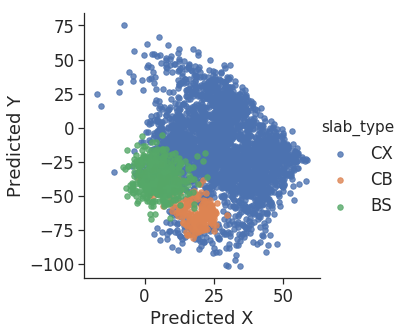

In [106]:
sns.lmplot('predicted_x', 'predicted_y', hue = 'slab_type', data=preds_df, 
           fit_reg=False, scatter_kws={"s": 30})
plt.xlabel('Predicted X')
plt.ylabel('Predicted Y')
#plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/figs/brain_plot_predicted.pdf',
#           bbox_inches='tight')

In [53]:
labs = [0 if gdf.loc[x,'slab_type'] == 'CX' else 1 if gdf.loc[x,'slab_type'] == 'BS' else 2 for x in gdf.index]
embedding = gdf[['abs_mni_nlin_x','mni_nlin_y','mni_nlin_z']].values

lmap = dict(zip(np.unique(labs),gdf.slab_type.unique()))
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/brain.html'

In [54]:
labs = [0 if gdf.loc[x,'slab_type'] == 'CX' else 1 if gdf.loc[x,'slab_type'] == 'BS' else 2 for x in gdf.index]
embedding = preds_df[['predicted_x','predicted_y','predicted_z']].values

lmap = dict(zip(np.unique(labs),gdf.slab_type.unique()))
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/corpredicted_brain.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/corpredicted_brain.html'

# Examine components

In [108]:
#reload(XD)

In [25]:
pls_mod = PLSRegression(n_components=3)
pls_mod.fit(pca_tfm, full_y)
bsrx, bsry, allx_bs, ally_bs = XD.bootstrap_features(PLSRegression(n_components=3), 
                                                  pls_mod, 
                                                  pca_tfm, 
                                                  full_y, 
                                                  n_iterations=1000)

finished iteration 0
finished iteration 100
finished iteration 200
finished iteration 300
finished iteration 400
finished iteration 500
finished iteration 600
finished iteration 700
finished iteration 800
finished iteration 900


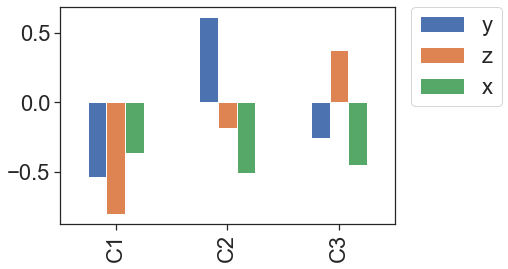

In [274]:
sns.set_context('notebook',font_scale=2)
g = pandas.DataFrame(pls_mod.y_weights_, 
                 index=['y','z','x'],
                 columns=['component %s'%x for x in range(3)]).T.plot.bar()
g.set_xticklabels(['C1','C2','C3'])
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/y_weights.pdf',
#             bbox_inches='tight')

In [26]:
plotr = pandas.concat([pandas.Series(allx_bs[0].values.flatten()),
                       #pandas.Series(list(range(100))*500)],
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

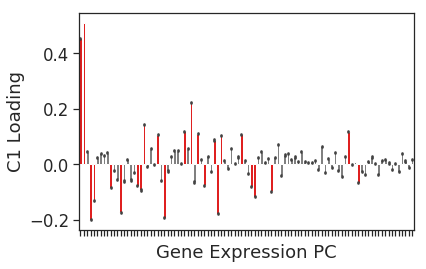

In [58]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
colors = ['Red' if x else 'Grey' for x in multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]]
g=sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C1 Loading')
g.set_xticklabels([None for x in range(100)])
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_XWeights.pdf',
            bbox_inches='tight')

In [27]:
sigs = multipletests(bsrx['p'].loc[0], method='fdr_bh')[0]
new_loading = [pls_mod.x_loadings_[x,0] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]

In [28]:
newc1 = np.dot(pcamod.components_.T, new_loading)
newc1 = pandas.concat([pandas.Series(newc1), pandas.Series(bigdf.columns)],
                      axis=1)

In [29]:
probe_index = pandas.DataFrame(probes,copy=True)
probe_index.index = probe_index.gene_symbol.values
for i,row in newc1.iterrows():
    if row['gene_symbol'] in probe_index.index:
        nm = probe_index.loc[row['gene_symbol'],'gene_name']
        if type(nm) == pandas.core.series.Series:
            newc1.loc[i,'gene_name'] = nm.values[0]
        elif pandas.notnull(nm):
            newc1.loc[i,'gene_name'] = nm

In [30]:
newc1.sort_values(0,ascending=False)

,0,gene_symbol,gene_name
12899,0.035092,STON1,stonin 1
10410,0.032879,PRPH,peripherin
7492,0.032635,LXN,latexin
12808,0.031333,ST3GAL6,"ST3 beta-galactoside alpha-2,3-sialyltransfera..."
1865,0.030787,CAVIN3,NaN
...,...,...,...
8095,-0.031260,MOXD1,"monooxygenase, DBH-like 1"
917,-0.032432,ASGR2,asialoglycoprotein receptor 2
3025,-0.033756,CTXN3,cortexin 3
13807,-0.035194,TNNT2,troponin T type 2 (cardiac)


In [62]:
newc1.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCORR_C1_genelist.csv')

In [31]:
allcomps = pandas.DataFrame(newc1,copy=True)
allcomps.columns = ['C1','gene_symbol','gene_name']

In [32]:
c1_xp = hap.get_gene_vector(pandas.DataFrame(bigdf.T), newc1[0])

In [67]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c1'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c1_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

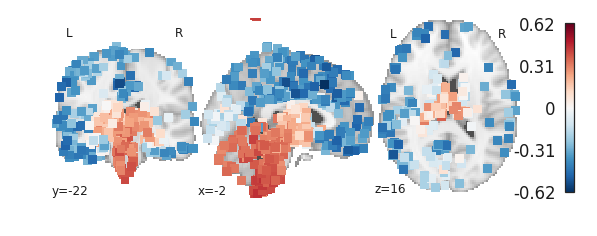

In [68]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigsC1_BrainGxp.pdf',
           bbox_inches='tight')



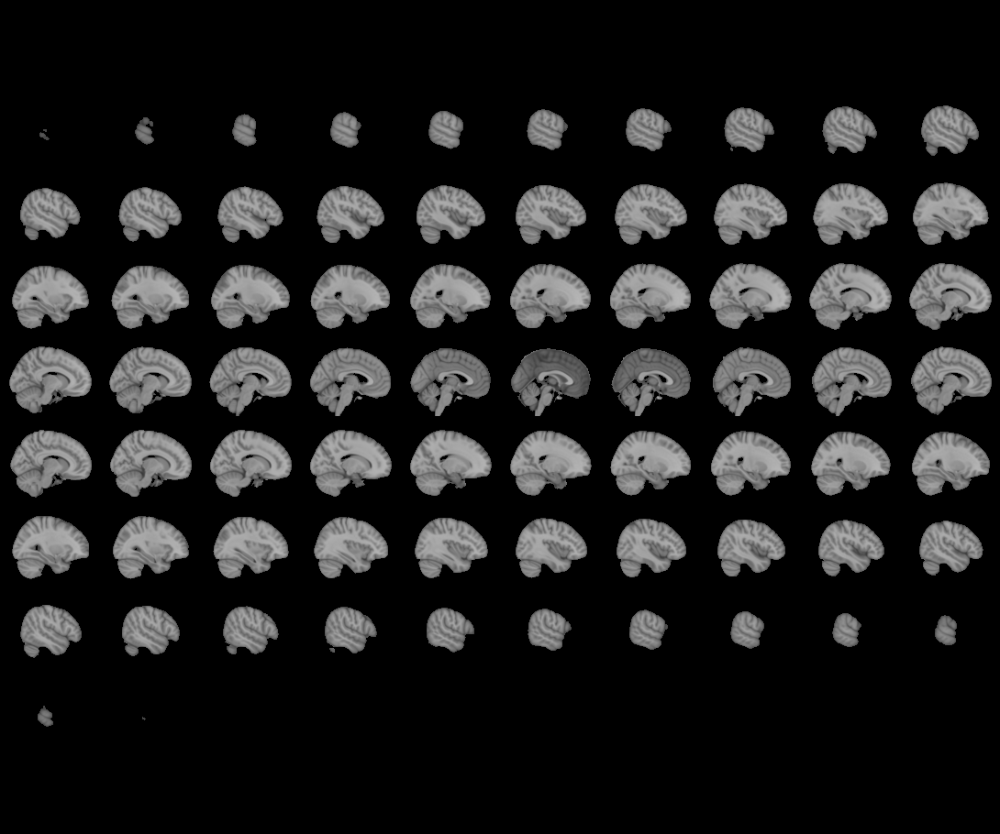
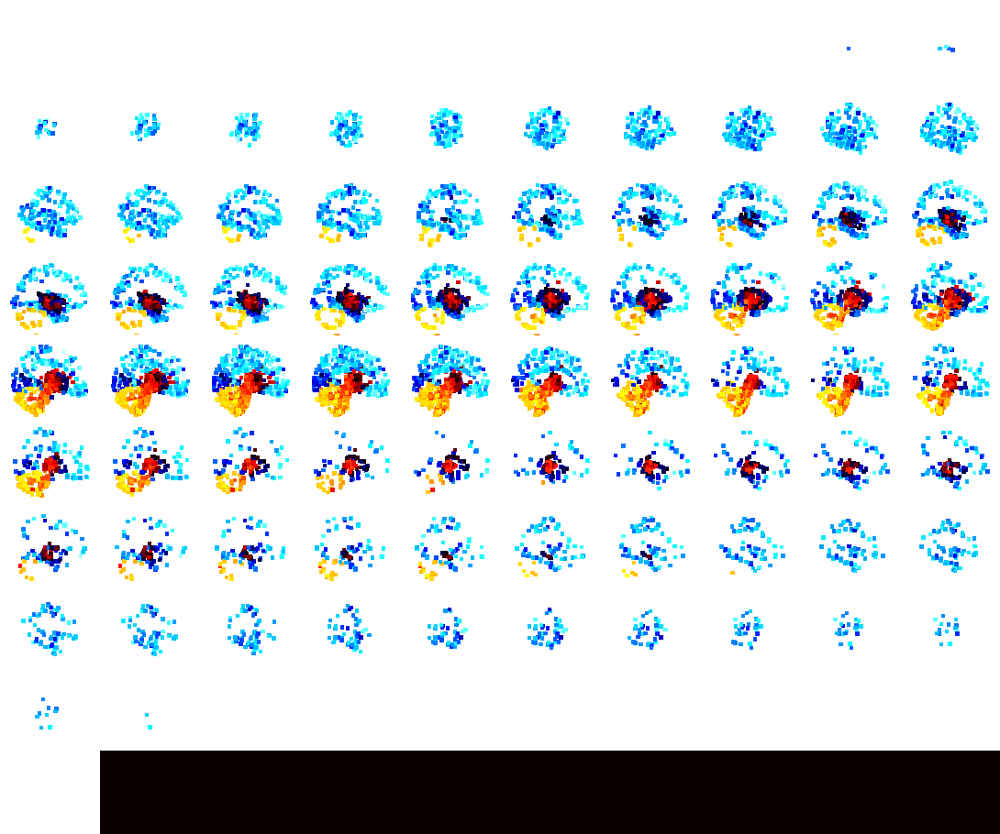

In [33]:
plotting.view_img(gcx_img)

In [69]:
gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_XWeights.nii.gz')

In [33]:
plotr = pandas.concat([pandas.Series(allx_bs[1].values.flatten()),
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

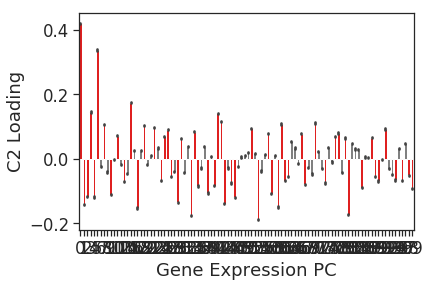

In [71]:
colors = ['Red' if x < 0.05 else 'Grey' for x in bsrx['p'].loc[1]]
sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C2 Loading')
g.set_xticklabels([None for x in range(100)])
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_XWeights.pdf',
            bbox_inches='tight')

In [84]:
bsrx['p']

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,0.001,0.001,0.007,0.071,0.002,0.001,0.002,0.45,0.002,0.001,...,0.365,0.317,0.389,0.28,0.401,0.27,0.495,0.282,0.208,0.234
1,0.001,0.001,0.003,0.001,0.001,0.001,0.001,0.001,0.052,0.008,...,0.003,0.186,0.017,0.098,0.142,0.001,0.015,0.207,0.001,0.003
2,0.001,0.051,0.018,0.362,0.001,0.01,0.428,0.001,0.43,0.001,...,0.001,0.298,0.354,0.496,0.346,0.017,0.185,0.054,0.118,0.249


In [86]:
# Need to modify this because for some reason nothing is significant


# sigs = multipletests(bsrx['p'].loc[1], method='fdr_bh')[0]
# new_loading = [pls_mod.x_loadings_[x,1] if not sigs[x] else 0 for x in range(pca_tfm.shape[-1])] # changed to if not here
# newc2 = np.dot(pcamod.components_.T, new_loading)
# newc2 = pandas.concat([pandas.Series(newc2), probes[['gene_symbol','gene_name']]], axis=1)

# UPDATE: The problem was the scores were sometimes arbitrarily inverted

In [34]:
sigs = multipletests(bsrx['p'].loc[1], method='fdr_bh')[0]
new_loading = [pls_mod.x_loadings_[x,1] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
newc2 = np.dot(pcamod.components_.T, new_loading)
newc2 = pandas.concat([pandas.Series(newc2), pandas.Series(bigdf.columns)],
                      axis=1)
for i,row in newc2.iterrows():
    if row['gene_symbol'] in probe_index.index:
        nm = probe_index.loc[row['gene_symbol'],'gene_name']
        if type(nm) == pandas.core.series.Series:
            newc2.loc[i,'gene_name'] = nm.values[0]
        elif pandas.notnull(nm):
            newc2.loc[i,'gene_name'] = nm

In [93]:
newc2.sort_values(0,ascending=False)

,0,gene_symbol,gene_name
10446,0.046736,PRRX1,paired related homeobox 1
13355,0.043314,TGFBI,"transforming growth factor, beta-induced, 68kDa"
489,0.040414,AMDHD1,amidohydrolase domain containing 1
14227,0.039789,TUNAR,NaN
13050,0.037448,SYT10,synaptotagmin X
5500,0.036839,HCN4,hyperpolarization activated cyclic nucleotide-...
2114,0.034467,CD6,CD6 molecule
497,0.034045,AMIGO2,adhesion molecule with Ig-like domain 2
15090,0.032450,ZMYND10,"zinc finger, MYND-type containing 10"
9531,0.032271,PCSK5,proprotein convertase subtilisin/kexin type 5


In [73]:
newc2.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_C2_genelist.csv')

In [35]:
allcomps.loc[:,'C2'] = newc2[newc2.columns[0]].values

In [36]:
c2_xp = hap.get_gene_vector(pandas.DataFrame(bigdf.T), newc2[0])

In [37]:
gdf.loc[:,'C2_Expression'] = c2_xp

In [77]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c2'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c2_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

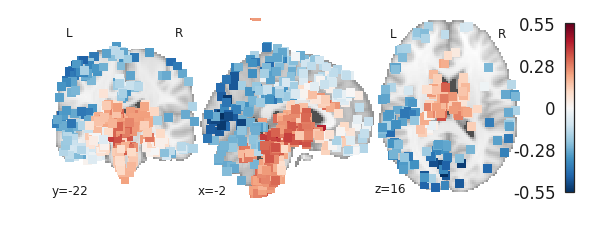

In [78]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_BrainGxp.pdf',
            bbox_inches='tight')


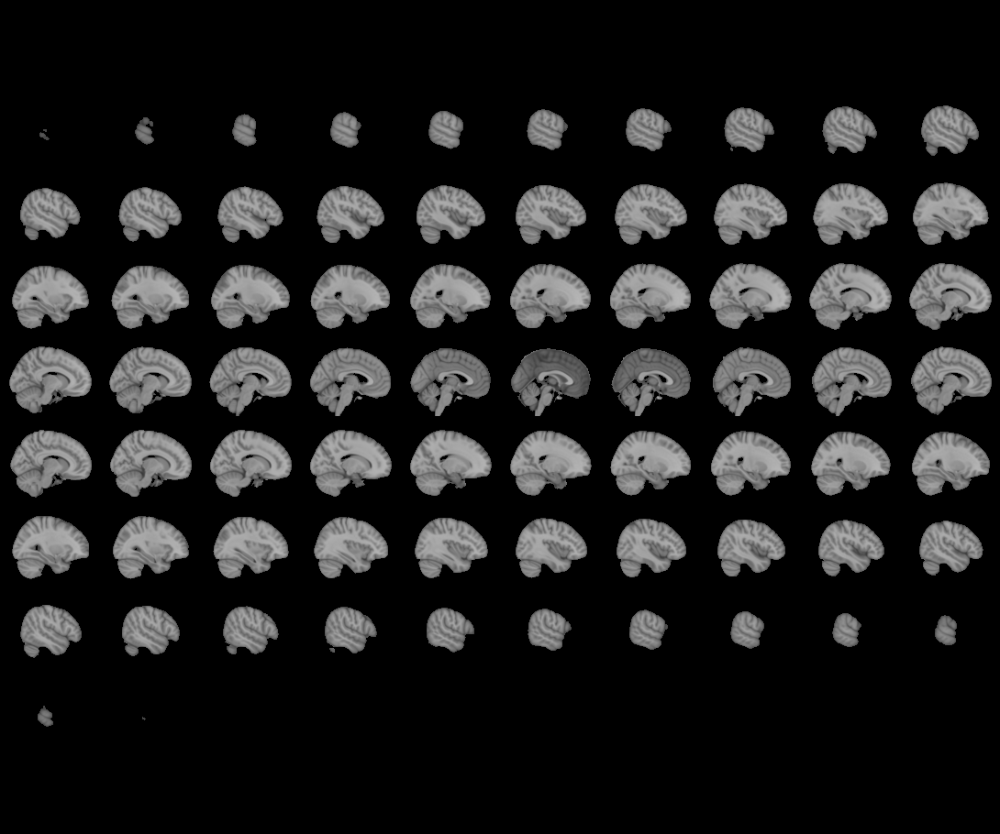
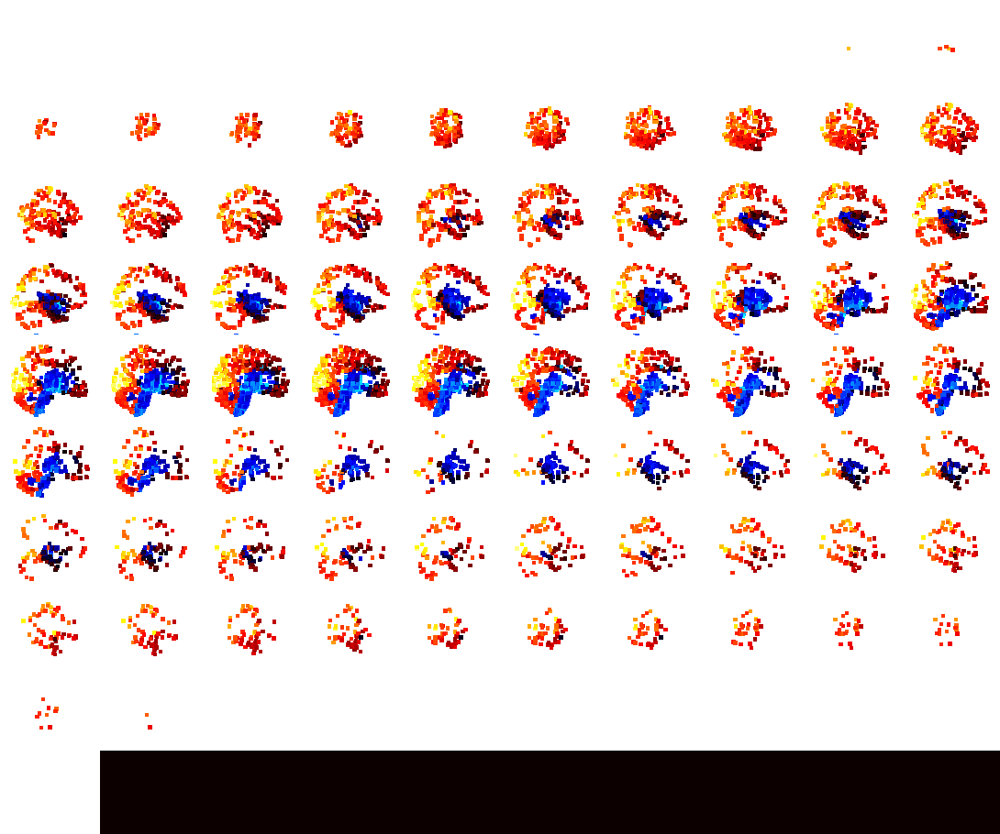

In [100]:
plotting.view_img(gcx_img)

In [79]:
gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_XWeights.nii.gz')

In [38]:
plotr = pandas.concat([pandas.Series(allx_bs[2].values.flatten()),
                       pandas.Series(list(range(100))*1000)],
                      axis=1)
plotr.columns = ['Loading','Component']

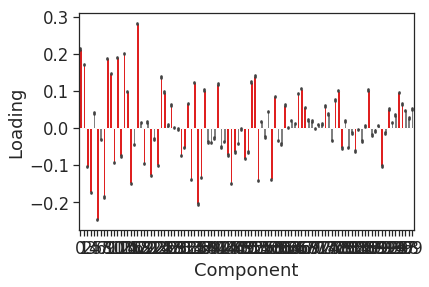

In [81]:
colors = ['Red' if x < 0.05 else 'Grey' for x in bsrx['p'].loc[2]]
sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)

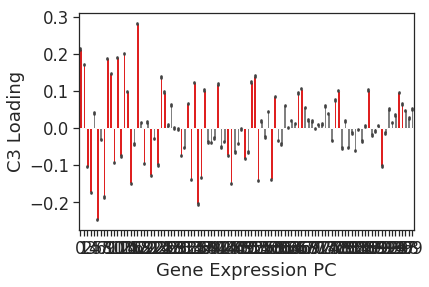

In [82]:
sns.set(font_scale=1.5)
sns.set_style('ticks')
colors = ['Red' if x else 'Grey' for x in multipletests(bsrx['p'].loc[2], method='fdr_bh')[0]]
sns.barplot(x='Component', y='Loading', data=plotr, palette=colors)
plt.xlabel('Gene Expression PC')
plt.ylabel('C3 Loading')
g.set_xticklabels([None for x in range(100)])
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_XWeights.pdf',
            bbox_inches='tight')

In [39]:
sigs = multipletests(bsrx['p'].loc[2], method='fdr_bh')[0]
new_loading = [pls_mod.x_loadings_[x,2] if sigs[x] else 0 for x in range(pca_tfm.shape[-1])]
newc3 = np.dot(pcamod.components_.T, new_loading)
newc3 = pandas.concat([pandas.Series(newc3), pandas.Series(bigdf.columns)],
                      axis=1)
for i,row in newc3.iterrows():
    if row['gene_symbol'] in probe_index.index:
        nm = probe_index.loc[row['gene_symbol'],'gene_name']
        if type(nm) == pandas.core.series.Series:
            newc3.loc[i,'gene_name'] = nm.values[0]
        elif pandas.notnull(nm):
            newc3.loc[i,'gene_name'] = nm

In [104]:
newc3.sort_values(0,ascending=False)

,0,gene_symbol,gene_name
4803,0.040281,G0S2,G0/G1switch 2
14647,0.039292,VSTM1,V-set and transmembrane domain containing 1
11116,0.036464,RILP,Rab interacting lysosomal protein
13323,0.035346,TEX26,testis expressed 26
9304,0.034005,P2RX6,"purinergic receptor P2X, ligand-gated ion chan..."
7005,0.033068,LINC01158,NaN
14657,0.032054,VWA3A,von Willebrand factor A domain containing 3A
10950,0.030705,RCAN2,regulator of calcineurin 2
379,0.030516,AIRE,autoimmune regulator
8650,0.030501,NEB,nebulin


In [84]:
newc3.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_C3_genelist.csv')

In [40]:
allcomps.loc[:,'C3_Expression'] = newc3[newc3.columns[0]].values

In [41]:
c3_xp = hap.get_gene_vector(pandas.DataFrame(bigdf.T), newc3[0])

In [42]:
gdf.loc[:,'C3_Expression'] = c3_xp

In [88]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c3'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c3_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

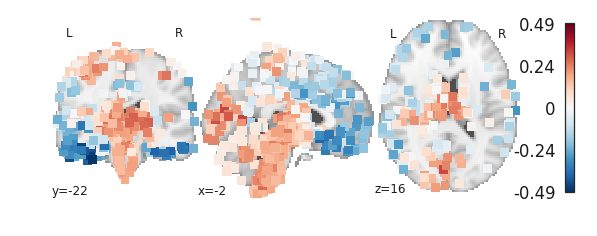

In [89]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_BrainGxp.pdf',
            bbox_inches='tight')

In [90]:
gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_XWeights.nii.gz')

### Prepare for GSEA

In [62]:
rank = pandas.DataFrame(index = probes.gene_symbol.unique(), columns = ['beta'])
for i,gene in enumerate(probes.gene_symbol.unique()):
    for col in probes.columns[-3:]:
        db = probes[probes.gene_symbol==gene][col]
        if type(db) == float:
            rank.loc[gene,col] = db
        else:
            #rank.loc[gene,'beta'] = db.mean() # take mean
            rank.loc[gene,col] = db.iloc[np.argmax(db.values)] # take highest rank
    if i%1000 == 0:
        print(i)

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000
24000
25000
26000
27000
28000
29000


In [65]:
rank.drop('beta',axis=1,inplace=True)

In [70]:
rank.sort_values('C2',ascending=False).head()

,C1,C2,C3
MET,0.028332,0.065229,-0.033451
TTR,0.001506,0.040164,0.062039
SOST,-0.001465,0.037713,0.012148
DMRT3,0.000724,0.035849,0.011679
CYP26B1,0.010748,0.035243,-0.009855


In [73]:
new_rank = pandas.DataFrame(index = range(len(rank)))
new_rank.loc[:,'Symbol'] = rank.index
for col in rank.columns:
    new_rank.loc[:,col] = rank[col].values

new_rank.head()

,Symbol,C1,C2,C3
0,C8G,0.000702,0.000065,-0.005231
1,C9,0.000390,0.000572,0.001446
2,MRPL49,0.001989,0.000026,-0.003131
3,ZNHIT2,0.003456,-0.000876,0.000026
4,MPPED2,0.002161,-0.000839,-0.001553


In [77]:
for col in rank.columns:
    new_rank.sort_values(col,ascending=False
                    )[['Symbol',col]].to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ADDX/LR_forGSEA_%s.rnk'%col,
                            sep = '\t', index=False)

# Understanding the components

In [74]:
Medulla = ['arcuate nucleus of medulla, left','arcuate nucleus of medulla, right',
                 'central glial substance',
                 'central medullary reticular group, left','central medullary reticular group, right',
                 'cochlear nuclei, left','cochlear nuclei, right',
                 'cuneate nucleus, left','cuneate nucleus, right',
                 'dorsal motor nucleus of the vagus, left','dorsal motor nucleus of the vagus, right',
                 'gigantocellular group, left','gigantocellular group, right',
                 'gracile nucleus, left','gracile nucleus, right',
                 'hypoglossal nucleus, left','hypoglossal nucleus, right',
                 'inferior olivary complex, left','inferior olivary complex, right',
                 'lateral medullary reticular group, left','lateral medullary reticular group, right',
                 'raphe nuclei of medulla',
                 'spinal trigeminal nucleus, left','spinal trigeminal nucleus, right',
                 'superior olivary complex, left','superior olivary complex, right',
                 'vestibular nuclei, left','vestibular nuclei, right']

Pons =          ['abducens nucleus, left','abducens nucleus, right',
                 'central gray of the pons, left','central gray of the pons, right',
                 'facial motor nucleus, left','facial motor nucleus, right',
                 'lateral parabrachial nucleus, left','lateral parabrachial nucleus, right',
                 'locus ceruleus, left','locus ceruleus, right',
                 'medial parabrachial nucleus, left','medial parabrachial nucleus, right',
                 'medial parabrachial nucleus,right',
                 'motor nucleus of trigeminal nerve, left','motor nucleus of trigeminal nerve, right',
                 'nucleus subceruleus, left','nucleus subceruleus, right',
                 'pontine nuclei, left','pontine nuclei, right',
                 'pontine raphe nucleus','pontine raphe nucleus, left',
                 'pontine reticular formation, left','pontine reticular formation, right',
                 'principal sensory nucleus of trigeminal nerve, left','principal sensory nucleus of trigeminal nerve, right',
                 ]

DCN = ['dentate nucleus, left',
       'dentate nucleus, right',
       'emboliform nucleus, left',
       'emboliform nucleus, right',
       'fastigial nucleus, left',
       'fastigial nucleus, right',
       'globose nucleus, left',
       'globose nucleus, right']

Cerebellum = [x for x in gdf[gdf.slab_type=='CB']['structure_name'].unique().tolist() if x not in DCN]

Tectum = ['inferior colliculus, left',
          'superior colliculus, left','superior colliculus, right',
          'pretectal region']

Tegmentum = ['central gray substance of midbrain, left','central gray substance of midbrain, right',
            'cuneiform nucleus, left','cuneiform nucleus, right',
            'Edinger-Westphal nucleus, left','Edinger-Westphal nucleus, right',
            'interstitial nucleus of Cajal, left','interstitial nucleus of Cajal, right',
            'midbrain raphe nuclei','midbrain raphe nuclei, left',
            'midbrain reticular formation, left','midbrain reticular formation, right',
            'nucleus of Darkschewitsch, left',
            'oculomotor nuclear complex, right','oculomotor nuclear complex, left',
            'red nucleus, left','red nucleus, right',
            'subcuneiform nucleus, left','subcuneiform nucleus, right',
            'substantia nigra, pars compacta, left','substantia nigra, pars compacta, right',
            'substantia nigra, pars reticulata, left','substantia nigra, pars reticulata, right',
            'trochlear nucleus, left','trochlear nucleus, right',
            'ventral tegmental area, left','ventral tegmental area, right']

Hypothalamus = ['anterior hypothalamic area, left','anterior hypothalamic area, right',
               'arcuate nucleus of the hypothalamus, left','arcuate nucleus of the hypothalamus, right',
               'dorsomedial hypothalamic nucleus, left',
               'lateral hypothalamic area, anterior region, left', 'lateral hypothalamic area, anterior region, right',
               'lateral hypothalamic area, mammillary region, left', 'lateral hypothalamic area, mammillary region, right',
               'lateral hypothalamic area, tuberal region, left',
               'paraventricular nucleus of the hypothalamus, left','paraventricular nucleus of the hypothalamus, right',
               'perifornical nucleus, left',
               'posterior hypothalamic area, left','posterior hypothalamic area, right',
               'preoptic region, left','preoptic region, right',
               'supraoptic nucleus, left','supraoptic nucleus, right',
               'ventromedial hypothalamic nucleus, left','ventromedial hypothalamic nucleus, right',]
                

Thalamus = ['anterior group of nuclei, left','anterior group of nuclei, right',
           'caudal group of intralaminar nuclei, left','caudal group of intralaminar nuclei, right',
           'dorsal lateral geniculate nucleus, left','dorsal lateral geniculate nucleus, right',
           'lateral group of nuclei, left, dorsal division','lateral group of nuclei, left, ventral division',
           'lateral group of nuclei, right, dorsal division','lateral group of nuclei, right, ventral division',
           'medial geniculate complex, left','medial geniculate complex, right',
           'medial group of nuclei, left','medial group of nuclei, right',
           'reticular nucleus of thalamus, left','reticular nucleus of thalamus, right',
           'rostral group of intralaminar nuclei, left','rostral group of intralaminar nuclei, right',
           'paraventricular nuclei, left of thalamus, left','paraventricular nuclei, right of thalamus, right',
           'posterior group of nuclei, left','posterior group of nuclei, right',
           'subthalamic nucleus, left','subthalamic nucleus, right',
           'zona incerta, left','zona incerta, right']

Other_Dien = ['lateral habenular nucleus, left','lateral habenular nucleus, right',
             'lateral mammillary nucleus, left',
             'lateral tuberal nucleus, left',
             'mammillary body, left','mammillary body, right',
             'medial habenular nucleus, left','medial habenular nucleus, right',
             'medial mammillary nucleus, left',
             'pallidohypothalamic nucleus, left',
             'pineal gland',
             'supramammillary nucleus, left',
             'tuberomammillary nucleus, left']

Limbic = ['CA1 field, left','CA1 field, right',
          'CA2 field, left','CA2 field, right',
          'CA3 field, left','CA3 field, right',
          'CA4 field, left','CA4 field, right',
          'amygdalohippocampal transition zone, left',
          'amygdalohippocampal transition zone, right',
          'basolateral nucleus, left','basolateral nucleus, right',
          'basomedial nucleus, left','basomedial nucleus, right',
          'central nucleus, left','central nucleus, right',
          'cortico-medial group, left','cortico-medial group, right',
          'dentate gyrus, left','dentate gyrus, right',
          'lateral nucleus, left','lateral nucleus, right',
          'septal nuclei, left','septal nuclei, right',
         'subiculum, left','subiculum, right']

Forebrain = ['basal nucleus of meynert, left','basal nucleus of meynert, right',
            'nucleus accumbens, left','nucleus accumbens, right',
            'nucleus of the diagonal band, left, horizontal division',
            'nucleus of the diagonal band, left, vertical division',
            'olfactory tubercle, left', 'piriform cortex, left',
            'substantia innominata, left','substantia innominata, right']

Striatum = ['bed  nucleus of stria terminalis, left',
            'body of caudate nucleus, left',
            'body of caudate nucleus, right',
            'globus pallidus, external segment, left','globus pallidus, external segment, right',
            'globus pallidus, internal segment, left','globus pallidus, internal segment, right',
            'head of caudate nucleus, left','head of caudate nucleus, right',
            'olfactory tubercle, left',
            'putamen, left','putamen, right',
           'tail of caudate nucleus, left','tail of caudate nucleus, right']

Anterior_Cingulate = ['cingulate gyrus, frontal part, left, inferior bank of gyrus',
                     'cingulate gyrus, frontal part, left, superior bank of gyrus',
                     'cingulate gyrus, frontal part, right, inferior bank of gyrus',
                     'cingulate gyrus, frontal part, right, superior bank of gyrus',
                     'paraterminal gyrus, right',
                     'parolfactory gyri, left','parolfactory gyri, right',
                     'subcallosal cingulate gyrus, left','subcallosal cingulate gyrus, right']

Posterior_Cingulate = ['cingulate gyrus, parietal part, left, inferior bank of gyrus',
                     'cingulate gyrus, parietal part, left, superior bank of gyrus',
                     'cingulate gyrus, parietal part, right, inferior bank of gyrus',
                     'cingulate gyrus, parietal part, right, superior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, left, inferior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, left, superior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, right, inferior bank of gyrus',
                     'cingulate gyrus, retrosplenial part, right, superior bank of gyrus',]

Insula = ['claustrum, left','claustrum, right',
         'long insular gyri, left','long insular gyri, right',
         'short insular gyri, left','short insular gyri, right',]

Temporal = ["Heschl's gyrus, left", "Heschl's gyrus, right",
           'fusiform gyrus, left, bank of cos','fusiform gyrus, left, bank of the its',
           'fusiform gyrus, left, lateral bank of gyrus','fusiform gyrus, right, bank of cos',
           'fusiform gyrus, right, bank of the its','fusiform gyrus, right, lateral bank of gyrus',
           'inferior temporal gyrus, left, bank of mts','inferior temporal gyrus, left, bank of the its',
           'inferior temporal gyrus, left, lateral bank of gyrus','inferior temporal gyrus, right, bank of mts',
           'inferior temporal gyrus, right, bank of the its','inferior temporal gyrus, right, lateral bank of gyrus',
           'middle temporal gyrus, left, inferior bank of gyrus','middle temporal gyrus, left, superior bank of gyrus',
           'middle temporal gyrus, right, inferior bank of gyrus','middle temporal gyrus, right, superior bank of gyrus',
           'occipito-temporal gyrus, left, inferior bank of gyrus','occipito-temporal gyrus, left, superior bank of gyrus',
           'occipito-temporal gyrus, right, inferior bank of gyrus','occipito-temporal gyrus, right, superior bank of gyrus',
           'parahippocampal gyrus, left, bank of the cos','parahippocampal gyrus, left, lateral bank of gyrus',
           'parahippocampal gyrus, right, bank of the cos','parahippocampal gyrus, right, lateral bank of gyrus',
           'superior temporal gyrus, left, inferior bank of gyrus','superior temporal gyrus, left, lateral bank of gyrus',
           'superior temporal gyrus, right, inferior bank of gyrus','superior temporal gyrus, right, lateral bank of gyrus',
           'temporal pole, left, inferior aspect','temporal pole, left, medial aspect',
           'temporal pole, left, superior aspect','temporal pole, right, inferior aspect',
           'temporal pole, right, medial aspect','temporal pole, right, superior aspect',
           'transverse gyri, left','transverse gyri, right',
           'planum polare, left','planum polare, right',
           'planum temporale, left','planum temporale, right']

Parietal = ['angular gyrus, left, inferior bank of gyrus','angular gyrus, left, superior bank of gyrus',
            'angular gyrus, right, inferior bank of gyrus','angular gyrus, right, superior bank of gyrus',
            'precuneus, left, inferior lateral bank of gyrus','precuneus, left, superior lateral bank of gyrus',
            'precuneus, right, inferior lateral bank of gyrus','precuneus, right, superior lateral bank of gyrus',
            'superior parietal lobule, left, inferior bank of gyrus','superior parietal lobule, left, superior bank of gyrus',
            'superior parietal lobule, right, inferior bank of gyrus','superior parietal lobule, right, superior bank of gyrus',
            'supramarginal gyrus, left, inferior bank of gyrus','supramarginal gyrus, left, superior bank of gyrus',
            'supramarginal gyrus, right, inferior bank of gyrus','supramarginal gyrus, right, superior bank of gyrus']

Frontal = ['anterior orbital gyrus, left','anterior orbital gyrus, right',
           'arcuate nucleus of the hypothalamus, left','arcuate nucleus of the hypothalamus, right',
          'frontal operculum, left','frontal operculum, right',
          'frontal pole, left, inferior aspect','frontal pole, left, medial aspect',
          'frontal pole, left, superior aspect','frontal pole, right, inferior aspect',
          'frontal pole, right, medial aspect','frontal pole, right, superior aspect',
          'gyrus rectus, left','gyrus rectus, right',
          'inferior frontal gyrus, opercular part, left','inferior frontal gyrus, opercular part, right',
          'inferior frontal gyrus, orbital part, left','inferior frontal gyrus, orbital part, right',
          'inferior frontal gyrus, triangular part, left','inferior frontal gyrus, triangular part, right',
          'inferior rostral gyrus, left','inferior rostral gyrus, right',
          'lateral orbital gyrus, left','lateral orbital gyrus, right',
          'medial orbital gyrus, left','medial orbital gyrus, right',
          'middle frontal gyrus, left, inferior bank of gyrus','middle frontal gyrus, left, superior bank of gyrus',
          'middle frontal gyrus, right, inferior bank of gyrus','middle frontal gyrus, right, superior bank of gyrus',
          'posterior orbital gyrus, left','posterior orbital gyrus, right',
          'superior frontal gyrus, left','superior frontal gyrus, left, lateral bank of gyrus',
          'superior frontal gyrus, left, medial bank of gyrus','superior frontal gyrus, right, lateral bank of gyrus',
          'superior frontal gyrus, right, medial bank of gyrus',
          'superior rostral gyrus, left','superior rostral gyrus, right']

Occipital = ['cuneus, left, peristriate',
             'cuneus, left, striate',
             'cuneus, right, peristriate',
             'cuneus, right, striate',
             'inferior occipital gyrus, left, inferior bank of gyrus','inferior occipital gyrus, left, superior bank of gyrus',
             'inferior occipital gyrus, right, inferior bank of gyrus','inferior occipital gyrus, right, superior bank of gyrus',
             'lingual gyrus, left, peristriate','lingual gyrus, left, striate',
             'lingual gyrus, right, peristriate','lingual gyrus, right, striate',
             'occipital pole, left, inferior aspect',
             'occipital pole, left, lateral aspect','occipital pole, left, superior aspect',
             'superior occipital gyrus, left, inferior bank of gyrus','superior occipital gyrus, left, superior bank of gyrus',
             'superior occipital gyrus, right, inferior bank of gyrus','superior occipital gyrus, right, superior bank of gyrus',]

Sensorimotor = ['paracentral lobule, anterior part, left','paracentral lobule, anterior part, left, inferior bank of gyrus',
                'paracentral lobule, anterior part, left, superior bank of gyrus','paracentral lobule, anterior part, right, inferior bank of gyrus',
                'paracentral lobule, anterior part, right, superior bank of gyrus','paracentral lobule, posterior part, left, bank of cingulate sulcus',
                'paracentral lobule, posterior part, left, lateral bank of gyrus','paracentral lobule, posterior part, right, bank of cingulate sulcus',
                'paracentral lobule, posterior part, right, lateral bank of gyrus',
                'postcentral gyrus, left, bank of the central sulcus','postcentral gyrus, left, bank of the posterior central sulcus',
                'postcentral gyrus, left, inferior lateral aspect of gyrus','postcentral gyrus, left, superior lateral aspect of gyrus',
                'postcentral gyrus, right, bank of the central sulcus','postcentral gyrus, right, bank of the posterior central sulcus',
                'postcentral gyrus, right, inferior lateral aspect of gyrus','postcentral gyrus, right, superior lateral aspect of gyrus',
                'precentral gyrus, left, bank of the central sulcus','precentral gyrus, left, bank of the precentral sulcus',
                'precentral gyrus, left, inferior lateral aspect of gyrus','precentral gyrus, left, superior lateral aspect of gyrus',
                'precentral gyrus, right, bank of the central sulcus','precentral gyrus, right, bank of the precentral sulcus',
                'precentral gyrus, right, inferior lateral aspect of gyrus','precentral gyrus, right, superior lateral aspect of gyrus']
            
divs = [Medulla, Pons, DCN, Cerebellum, Tectum, Tegmentum, Hypothalamus, Thalamus, Other_Dien,
                  Limbic, Forebrain, Striatum, Anterior_Cingulate, Posterior_Cingulate, Insula,
                  Temporal, Frontal, Parietal, Occipital, Sensorimotor]
names = ['Medulla', 'Pons', 'DCN', 'Cerebellum', 'Tectum', 'Tegmentum', 'Hypothalamus', 'Thalamus', 
         'Other_Dien', 'Limbic', 'Forebrain', 'Striatum', 'Anterior_Cingulate', 'Posterior_Cingulate', 
         'Insula', 'Temporal', 'Frontal', 'Parietal', 'Occipital', 'Sensorimotor']
brain_division = dict(zip(names,divs))

for name, div in brain_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'brain_divison'] = name
    

In [75]:
# For C1
Meyelencephalon = Medulla[:] 
Metencelphalon = Pons + DCN + Cerebellum
Mesencephalon = Tectum + Tegmentum
Diencephalon = Hypothalamus + Thalamus + Other_Dien
Telencephalon = Limbic + Forebrain + Striatum + Anterior_Cingulate + Posterior_Cingulate +\
                Insula + Temporal + Frontal + Parietal + Occipital + Sensorimotor

divs = [Meyelencephalon, Metencelphalon, Mesencephalon, Diencephalon, Telencephalon]
names = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 'Diencephalon', 'Telencephalon']
brain_division = dict(zip(names,divs))

for name, div in brain_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'Neural_Tube_segment'] = name
    

In [76]:
# For C3

Auditory = ["Heschl's gyrus, left", "Heschl's gyrus, right",
            'planum polare, left','planum polare, right',
            'planum temporale, left','planum temporale, right',
            'transverse gyri, left','transverse gyri, right']
Visual = ['cuneus, left, peristriate','cuneus, left, striate',
                 'cuneus, right, peristriate','cuneus, right, striate',
                 'lingual gyrus, left, peristriate','lingual gyrus, left, striate',
                 'lingual gyrus, right, peristriate','lingual gyrus, right, striate']
Olfactory = ['olfactory tubercle, left', 'piriform cortex, left']


Sensory_Cortex = Sensorimotor + Auditory + Visual + Olfactory
gdf.loc[gdf[gdf.structure_name.isin(Sensory_Cortex)].index,'Cortical_Type'] = 'Sensory'

Association_Cortex = [x for x in Telencephalon if x not in Striatum and x not in Sensory_Cortex]
gdf.loc[gdf[gdf.structure_name.isin(Association_Cortex)].index,'Cortical_Type'] = 'Association_Cortex'

Cerebellar_Cortex = [x for x in Cerebellum]
gdf.loc[gdf[gdf.structure_name.isin(Cerebellar_Cortex)].index,'Cortical_Type'] = 'Cerebellar_Cortex'

Not_Cortex = Meyelencephalon + Mesencephalon + Pons + DCN + Diencephalon + Striatum
gdf.loc[gdf[gdf.structure_name.isin(Not_Cortex)].index,'Cortical_Type'] = 'Not Cortex'


divs = [Auditory, Visual, Olfactory, Sensorimotor, Association_Cortex, Not_Cortex, Cerebellar_Cortex]
names = ['Auditory','Visual','Olfactory','Sensorimotor','Association_Cortex','Not_Cortex','Cerebellar_Cortex']
brain_division = dict(zip(names,divs))
for name, div in brain_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'Sensory_Type'] = name


In [77]:
# for c2
alar_medulla = ['spinal trigeminal nucleus, right', 'spinal trigeminal nucleus, left',
               'cochlear nuclei, left','cochlear nuclei, right',
               'vestibular nuclei, left','vestibular nuclei, right',
               'inferior olivary complex, left','inferior olivary complex, right',
                'gracile nucleus, left','gracile nucleus, right',
               'cuneate nucleus, left','cuneate nucleus, right',
               'superior olivary complex, left','superior olivary complex, right',]

basal_medulla = ['hypoglossal nucleus, left','hypoglossal nucleus, right',
                'lateral medullary reticular group, left','lateral medullary reticular group, right',
                'dorsal motor nucleus of the vagus, left','dorsal motor nucleus of the vagus, right', 
                'arcuate nucleus of medulla, left','arcuate nucleus of medulla, right',
                'central medullary reticular group, left','central medullary reticular group, right',
                'raphe nuclei of medulla',
                'gigantocellular group, left','gigantocellular group, right', ]


divs = [alar_medulla, basal_medulla]
names = ['Alar_Medulla','Basal_Medulla']
med_division = dict(zip(names,divs))

for name, div in med_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'brain_divison'] = name

dorsal_plate = ['Cerebellum', 'Thalamus', 'Tectum', 'Alar_Medulla']
ventral_plate = ['Hypothalamus','Pons','Tegmentum','Basal_Medulla']
subcortical = ['Forebrain', 'Striatum', 'Limbic']
frontal = ['Anterior_Cingulate','Insula','Frintal']
temporal = ['Temporal']
somatomotor = ['Sensorimotor']
parietal = ['Parietal']
occipital = ['Occipital']

gdf.loc[gdf[gdf.brain_divison.isin(dorsal_plate)].index,'Neural_Plate'] = 'Dorsal'
gdf.loc[gdf[gdf.brain_divison.isin(ventral_plate)].index,'Neural_Plate'] = 'Ventral'
gdf.loc[gdf[gdf.brain_divison.isin(subcortical)].index,'Neural_Plate'] = 'Subcortical'
gdf.loc[gdf[gdf.brain_divison.isin(frontal)].index,'Neural_Plate'] = 'Frontal'
gdf.loc[gdf[gdf.brain_divison.isin(temporal)].index,'Neural_Plate'] = 'Temporal'
gdf.loc[gdf[gdf.brain_divison.isin(somatomotor)].index,'Neural_Plate'] = 'Somatomotor'
gdf.loc[gdf[gdf.brain_divison.isin(parietal)].index,'Neural_Plate'] = 'Parietal'
gdf.loc[gdf[gdf.brain_divison.isin(occipital)].index,'Neural_Plate'] = 'Occipital'


In [302]:
#gdf.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/MAIN_gcx_wholebrain_info_W_BRAIN_DIVISIONS.csv')

In [78]:
# for GTeX

gfrontal = Frontal
gAC = Anterior_Cingulate
gCereb = Cerebellum
gHT = Hypothalamus
gCaud = ['body of caudate nucleus, left',
         'body of caudate nucleus, right',
        'head of caudate nucleus, left',
         'head of caudate nucleus, right',
        'tail of caudate nucleus, left',
         'tail of caudate nucleus, right']
gPut = ['putamen, left','putamen, right',]
gGP = ['globus pallidus, external segment, left',
       'globus pallidus, external segment, right',
       'globus pallidus, internal segment, left',
       'globus pallidus, internal segment, right',]
gAmyg = ['basolateral nucleus, left','basolateral nucleus, right',
          'basomedial nucleus, left','basomedial nucleus, right',
          'central nucleus, left','central nucleus, right',
          'cortico-medial group, left','cortico-medial group, right',
        'lateral nucleus, left','lateral nucleus, right']
gHipp = ['CA1 field, left','CA1 field, right',
          'CA2 field, left','CA2 field, right',
          'CA3 field, left','CA3 field, right',
          'CA4 field, left','CA4 field, right',
         'dentate gyrus, left','dentate gyrus, right',
        'subiculum, left','subiculum, right']
sn = ['substantia nigra, pars compacta, left',
      'substantia nigra, pars compacta, right',
      'substantia nigra, pars reticulata, left',
      'substantia nigra, pars reticulata, right']
gNAcc = ['nucleus accumbens, left','nucleus accumbens, right',]

divs = [gfrontal, gAC, gCereb, gHT, gCaud, gPut, gGP, gAmyg, 
        gHipp,sn,gNAcc]
names = ['Frontal', 'AntCing', 'Cerebellum', 'Hypothalamus', 
         'Caudate','Putamen','Pallidum','Amygdala','Hippocampus',
        'Nigra','Accumbens']
brain_division = dict(zip(names,divs))

for name, div in brain_division.items():
    gdf.loc[gdf[gdf.structure_name.isin(div)].index,'GTeX_div'] = name
    

In [95]:
code = dict(zip(gdf.Neural_Tube_segment.unique().tolist(),
               range(len(gdf.Neural_Tube_segment.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.Neural_Tube_segment.values]
embedding = gdf[['abs_mni_nlin_x','mni_nlin_y','mni_nlin_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(5)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/NT_brain.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/NT_brain.html'

In [96]:
code = dict(zip(gdf.Neural_Tube_segment.unique().tolist(),
               range(len(gdf.Neural_Tube_segment.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.Neural_Tube_segment.values]
embedding = preds_df[['predicted_x','predicted_y','predicted_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(5)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab10(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/PCorr_NT_brain_predicted.html')
    

'/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/PCorr_NT_brain_predicted.html'

In [97]:
code = dict(zip(gdf.brain_divison.unique().tolist(),
               range(len(gdf.brain_divison.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.brain_divison.values]
embedding = gdf[['abs_mni_nlin_x','mni_nlin_y','mni_nlin_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(19)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab20(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/ADDX/brain.html')
    

KeyError: 19

In [347]:
code = dict(zip(gdf.brain_divison.unique().tolist(),
               range(len(gdf.brain_divison.unique().tolist()))))
labs = [code[x] if pandas.notnull(x) else 999 for x in gdf.brain_divison.values]
embedding = preds_df[['predicted_x','predicted_y','predicted_z']].values

lmap = {v: k for k, v in code.items()}
lmap.pop(19)
lmap.update({999: 'NaN'})
traces = list()
for lab in np.unique(labs):
    l_index = [x for x in range(len(labs)) if labs[x] == lab]
    l_embed = embedding[l_index]
#     color_str = str(int('0x' + color_dict[lab][1:3].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][3:5].upper(),16)) + ',' + \
#                    str(int('0x' + color_dict[lab][5:7].upper(),16))
    #color_str = plt.cm.tab10.colors[lab]
    color_str = 'rgba %s'%str(tuple([x - 0.0000001 for x in plt.cm.tab20(lab) if x > 0]))
    temp_trace = plotly.graph_objs.Scatter3d(x=l_embed[:,0],
                                            y = l_embed[:,1],
                                            z = l_embed[:,2],
                                            name = lmap[lab],
                                            mode = 'markers',
                                            marker = dict(size=3,
                                                          color=color_str
                                                         )
                                            )
    traces.append(temp_trace)

layout = plotly.graph_objs.Layout(margin = dict(l=0,r=0,b=0,t=0))

fig = plotly.graph_objs.Figure(data=traces, layout=layout)
plotly.offline.plot(fig, 
                    filename='/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ADDX/brain_predicted.html')
    

/home/users/jvogel/anaconda2/envs/py3/lib/python3.6/subprocess.py:761: ResourceWarning:

subprocess 19487 is still running



'file:///home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ADDX/brain_predicted.html'

In [43]:
gdf.loc[:,'Component1_Expresion'] = c1_xp
gdf.loc[:,'Component2_Expresion'] = c2_xp
gdf.loc[:,'Component3_Expresion'] = c3_xp


/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 15.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 43.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 6.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 52.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


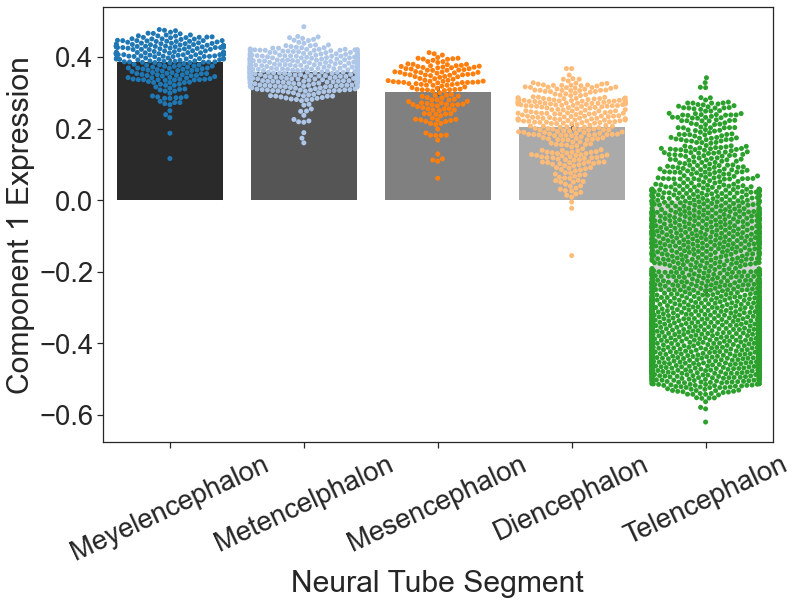

In [320]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 
         'Diencephalon', 'Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component1_Expresion', 
            data=gdf,palette='gray',
           order = order)
g=sns.swarmplot(x='Neural_Tube_segment', y='Component1_Expresion', 
              data=gdf, 
              #hue='brain_divison',
              order = order, palette='tab20')
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.xlabel('Neural Tube Segment')
plt.ylabel('Component 1 Expression')
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/C1_NT.pdf',
           bbox_inches='tight')

In [101]:
rbpal = [sns.color_palette('RdBu')[0],
                      sns.color_palette('RdBu')[-1]]

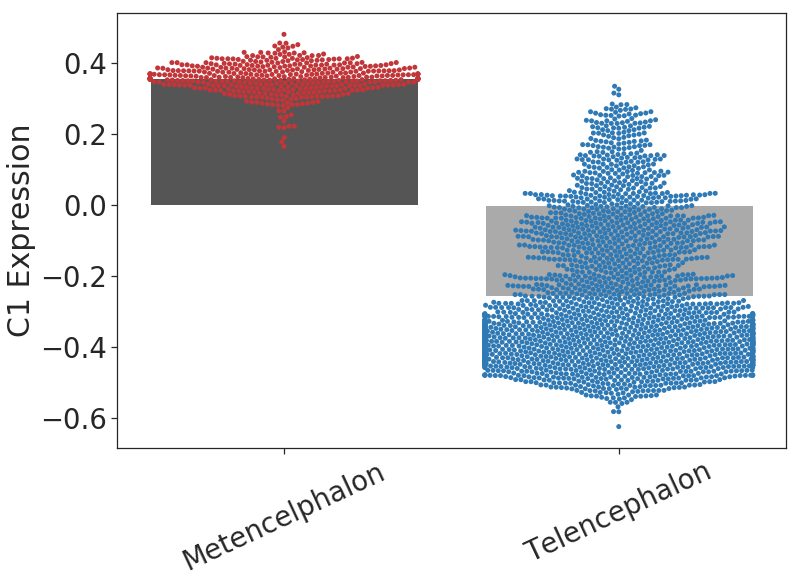

In [102]:
# Just cortex and cerebellum
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Metencelphalon','Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component1_Expresion', 
            data=gdf[gdf.Neural_Tube_segment.isin(order)],
            palette='gray',
           order = order
           )
g=sns.swarmplot(x='Neural_Tube_segment', y='Component1_Expresion', 
              data=gdf[gdf.Neural_Tube_segment.isin(order)], 
              #hue='brain_divison',
              order = order, palette=rbpal)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.ylabel('C1 Expression')
plt.xlabel('')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/BSComp_ABA_C1.pdf',
           bbox_inches='tight')

In [103]:
bsn = []
for x in gdf.structure_name.values:
    if ',' in x:
        bsn.append(x.split(',')[0])
    else:
        bsn.append(x)
gdf.loc[:,'bilateral_structure_name'] = bsn

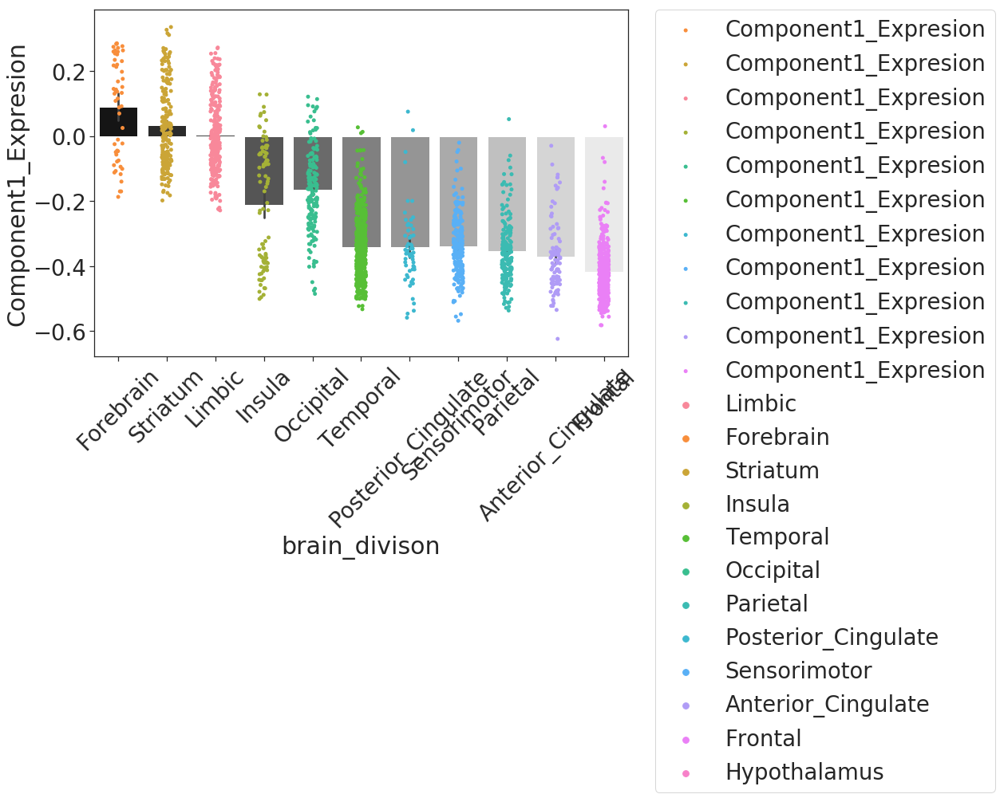

In [104]:
plt.subplots(figsize=(12,8))
order = ['Forebrain', 'Striatum', 'Limbic', 'Insula', 'Occipital',
        'Temporal','Posterior_Cingulate','Sensorimotor','Parietal',
        'Anterior_Cingulate','Frontal']
g=sns.barplot(x='brain_divison', y='Component1_Expresion', order = order,
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'], palette='gray',
           )
h=sns.stripplot(x='brain_divison', y='Component1_Expresion', order=order,jitter=True,
              hue='brain_divison',
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
           )
for item in h.get_xticklabels():
    item.set_rotation(45)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C1_Tele.pdf',
           bbox_inches='tight')

In [105]:
gdf.Sensory_Type.value_counts()

Association_Cortex    1729
Not_Cortex            1089
Cerebellar_Cortex      256
Sensorimotor           215
Visual                 107
Auditory                60
Olfactory                8
Name: Sensory_Type, dtype: int64

/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 26.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 25.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 38.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


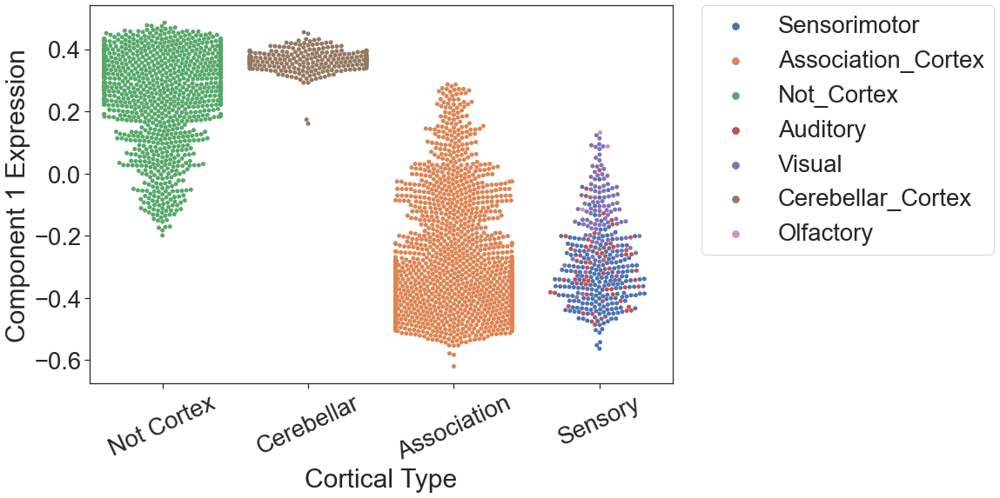

In [326]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Not Cortex','Cerebellar_Cortex','Association_Cortex','Sensory']
g=sns.swarmplot(x='Cortical_Type', y='Component1_Expresion', data=gdf, hue='Sensory_Type', order=order)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(['Not Cortex','Cerebellar','Association','Sensory'],
                  rotation=25)
plt.xlabel('Cortical Type')
plt.ylabel('Component 1 Expression')
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/C1_Modals.pdf',
           bbox_inches='tight')

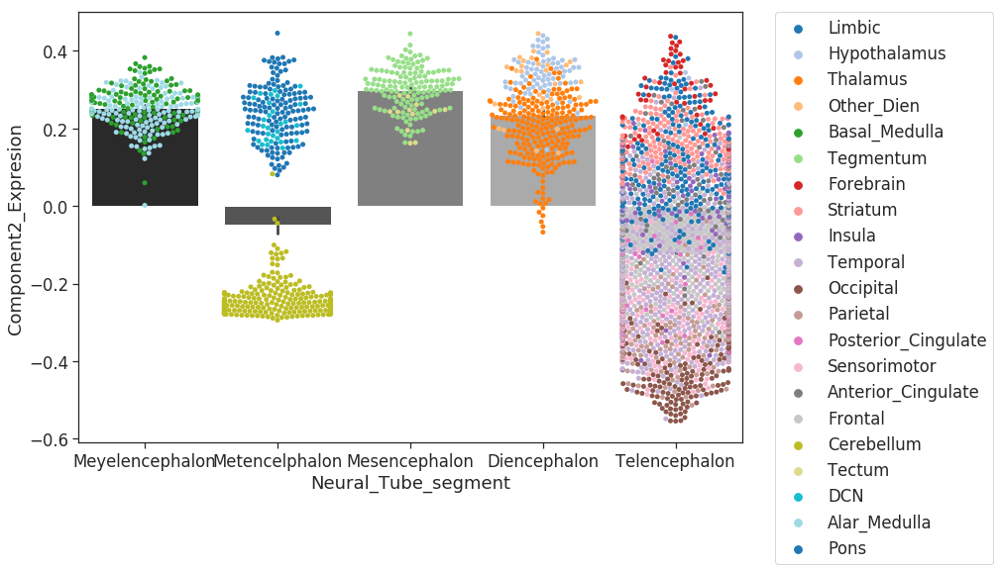

In [115]:
sns.set_context('notebook',font_scale=1.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 'Diencephalon', 'Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component2_Expresion', data=gdf,palette='gray',
           order = order)
sns.swarmplot(x='Neural_Tube_segment', y='Component2_Expresion', data=gdf, hue='brain_divison',
              order = order, palette='tab20')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT.pdf',
           bbox_inches='tight')

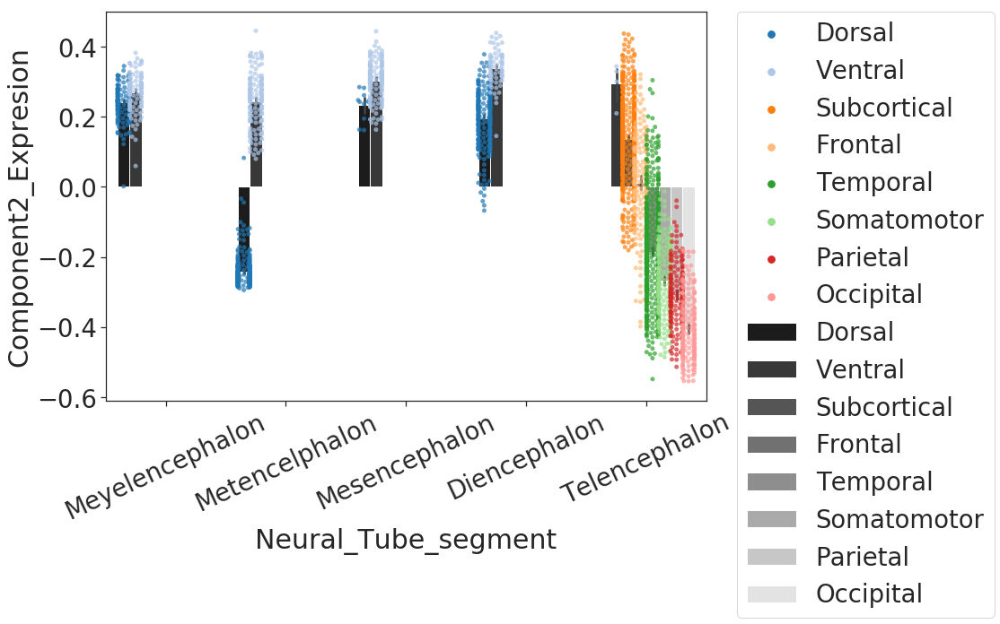

In [116]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 
         'Diencephalon','Telencephalon']
horder = ['Dorsal','Ventral','Subcortical','Frontal','Temporal',
         'Somatomotor','Parietal','Occipital']
sns.barplot(x='Neural_Tube_segment', y='Component2_Expresion', 
            data=gdf,palette='gray',hue='Neural_Plate',
           order = order,hue_order=horder)
g=sns.swarmplot(x='Neural_Tube_segment', y='Component2_Expresion', 
              data=gdf, hue='Neural_Plate',dodge=True,
              order = order, palette='tab20',hue_order=horder,
               alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT.pdf',
           bbox_inches='tight')

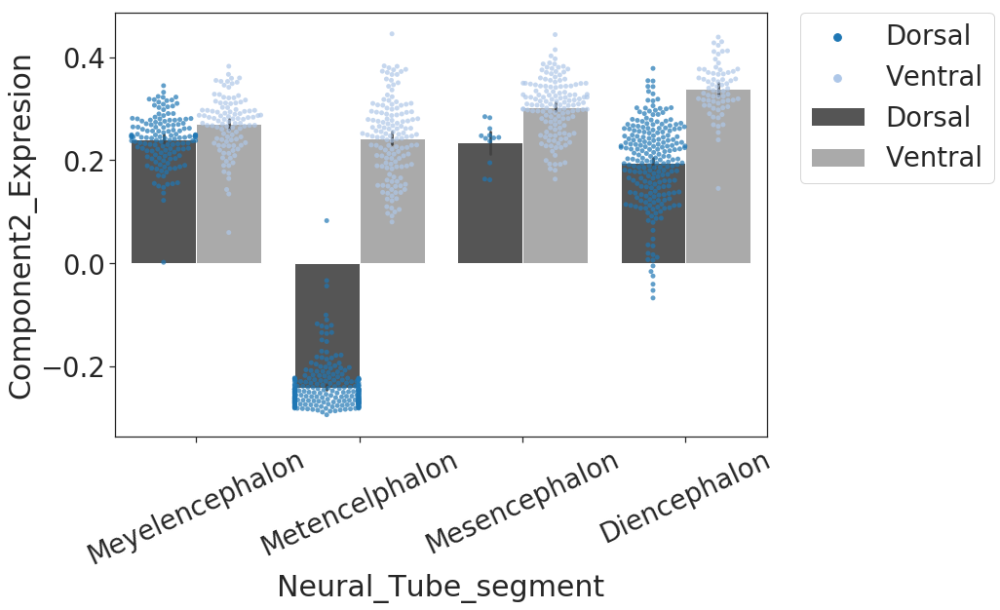

In [117]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 
         'Diencephalon']
horder = ['Dorsal','Ventral']
sns.barplot(x='Neural_Tube_segment', y='Component2_Expresion', 
            data=gdf[gdf.Neural_Tube_segment!='Telencephalon'],
            palette='gray',hue='Neural_Plate',
           order = order,hue_order=horder)
g=sns.swarmplot(x='Neural_Tube_segment', y='Component2_Expresion', 
              data=gdf[gdf.Neural_Tube_segment!='Telencephalon'],
                hue='Neural_Plate',dodge=True,
              order = order, palette='tab20',hue_order=horder,
               alpha=0.7)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT-NoTele.pdf',
           bbox_inches='tight')

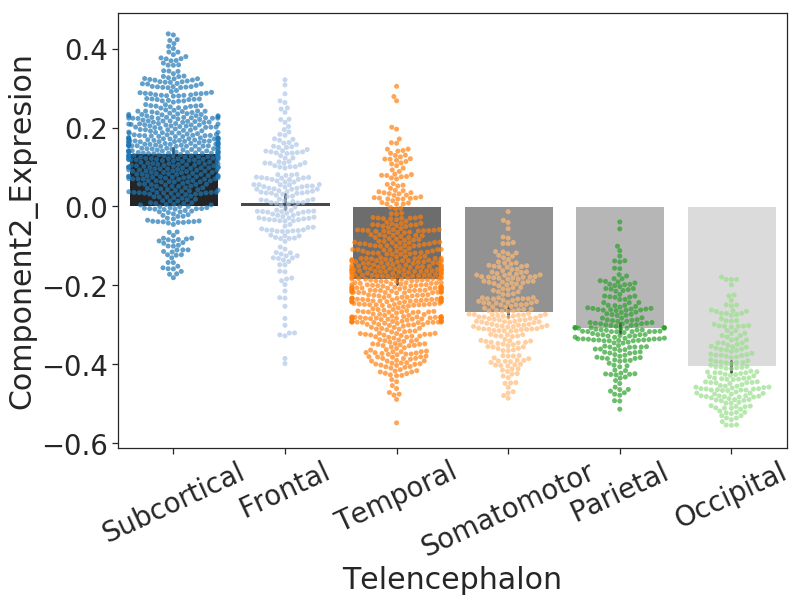

In [118]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Subcortical', 'Frontal', 'Temporal','Somatomotor', 
         'Parietal','Occipital']
#horder = ['Dorsal','Ventral']
sns.barplot(x='Neural_Plate', y='Component2_Expresion', 
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
            palette='gray',#hue='Neural_Plate',
           order = order,
            hue_order=order
           )
g=sns.swarmplot(x='Neural_Plate', y='Component2_Expresion', 
              data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
                #hue='Neural_Plate',dodge=True,
              order = order, 
                #hue_order=order,
                palette='tab20',alpha=0.7)
#plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(order,rotation=25)
plt.xlabel('Telencephalon')
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_NT-TeleOnly.pdf',
           bbox_inches='tight')

In [79]:
for i in range(1,4):
    c_vals = pandas.pivot_table(gdf,values='Component%s_Expresion'%i,
                                 index='brain_divison',aggfunc=np.mean
                                )
    for div in c_vals.index:
        sem = gdf[gdf.brain_divison==div]['Component%s_Expresion'%i
                                         ].sem()
        c_vals.loc[div,'sem'] = sem
    #c_vals.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_BSComp_ABA_C%s_data.csv'%i)
    c_vals.head()

In [82]:
# for PD analysis
gdf.loc[:,'PD_CD38'] = bigdf['CD38'].values
gdf.loc[:,'PD_WDR6'] = bigdf['WDR6'].values
for col in [x for x in gdf.columns if 'PD_' in x]:
    c_vals = pandas.pivot_table(gdf,values=col,
                                 index='brain_divison',aggfunc=np.mean
                                )
    for div in c_vals.index:
        sem = gdf[gdf.brain_divison==div][col].sem()
        c_vals.loc[div,'sem'] = sem
        c_vals.to_csv('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/GCorr_PDComp_%s.csv'%col)

In [81]:
c2_vals = pandas.pivot_table(gdf,values='Component2_Expresion',
                             index='brain_divison',aggfunc=np.mean
                            )
for div in c2_vals.index:
    sem = gdf[gdf.brain_divison==div]['Component2_Expresion'].sem()
    c2_vals.loc[div,'sem'] = sem
#c2_vals.to_csv('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/GCorr_BSComp_ABA_C2_data.csv')
c2_vals.head()

,Component2_Expresion,sem
brain_divison,,
Alar_Medulla,0.240864,0.004213
Anterior_Cingulate,0.029204,0.012916
Basal_Medulla,0.268872,0.005458
Cerebellum,-0.245697,0.002831
DCN,0.214673,0.009641


In [49]:
### same thing for GTeX
for i in range(1,4):
    c_vals = pandas.pivot_table(gdf,values='Component%s_Expresion'%i,
                                 index='GTeX_div',aggfunc=np.mean
                                )
    for div in c_vals.index:
        sem = gdf[gdf.GTeX_div==div]['Component%s_Expresion'%i
                                         ].sem()
        c_vals.loc[div,'sem'] = sem
    c_vals.to_csv('~/Science/PLS_GXP/GCorr_GTexComp_ABA_C%s_data.csv'%i)


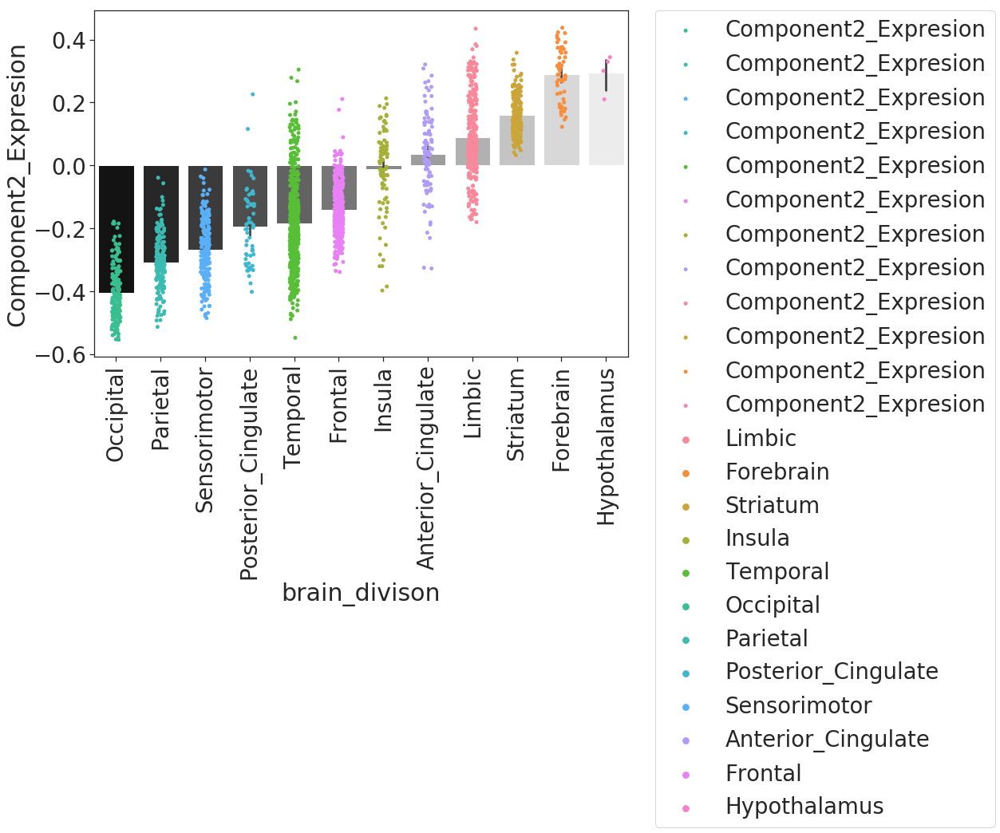

In [121]:
order = gdf[gdf.Neural_Tube_segment=='Telencephalon'
           ].pivot_table(values='Component2_Expresion',index = 'brain_divison'
                       ).sort_values('Component2_Expresion').index

plt.subplots(figsize=(12,8))
g=sns.barplot(x='brain_divison', y='Component2_Expresion', order = order,
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'], palette='gray',
           )
h=sns.stripplot(x='brain_divison', y='Component2_Expresion', order=order,jitter=True,
              hue='brain_divison',
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
           )
for item in h.get_xticklabels():
    item.set_rotation(90)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_Tele.pdf',
           bbox_inches='tight')

/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 38.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 26.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 24.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


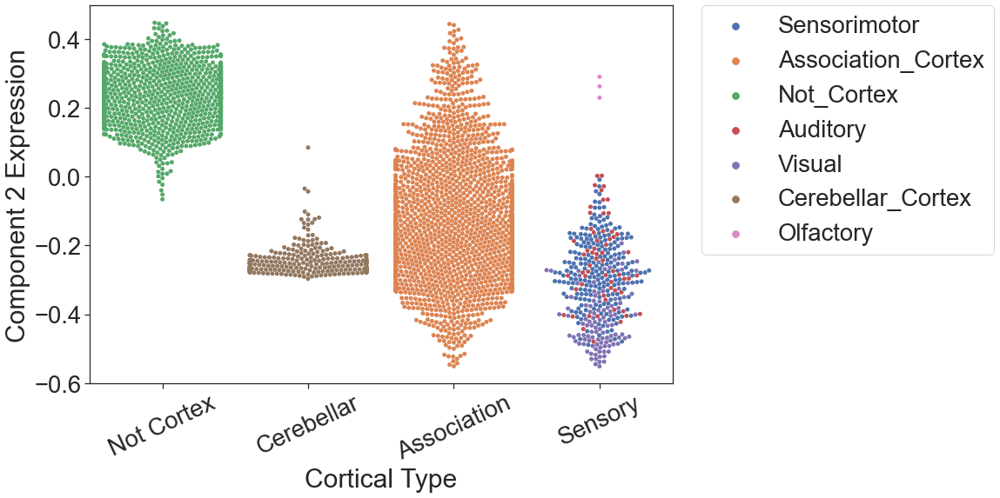

In [327]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Not Cortex','Cerebellar_Cortex','Association_Cortex','Sensory']
g=sns.swarmplot(x='Cortical_Type', y='Component2_Expresion', data=gdf, hue='Sensory_Type', order=order)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(['Not Cortex','Cerebellar','Association','Sensory'],
                  rotation=25)
plt.xlabel('Cortical Type')
plt.ylabel('Component 2 Expression')
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/C2_Modals.pdf',
           bbox_inches='tight')

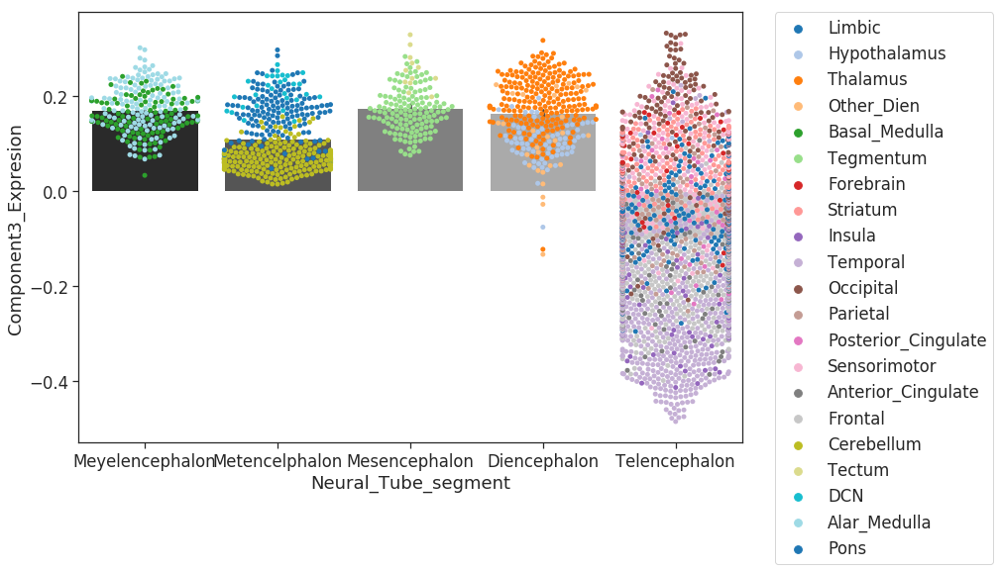

In [125]:
sns.set_context('notebook',font_scale=1.5)
plt.subplots(figsize=(12,8))
order = ['Meyelencephalon', 'Metencelphalon', 'Mesencephalon', 'Diencephalon', 'Telencephalon']
sns.barplot(x='Neural_Tube_segment', y='Component3_Expresion', data=gdf,palette='gray',
           order = order)
sns.swarmplot(x='Neural_Tube_segment', y='Component3_Expresion', data=gdf, hue='brain_divison',
              order = order, palette='tab20')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_NT.pdf',
           bbox_inches='tight')

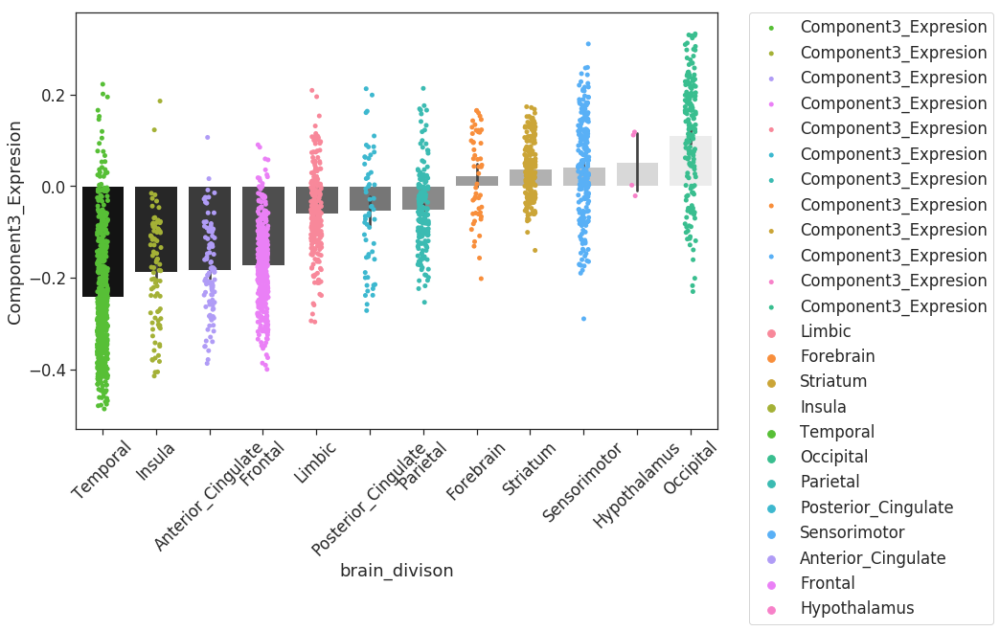

In [126]:
order = gdf[gdf.Neural_Tube_segment=='Telencephalon'
           ].pivot_table(values='Component3_Expresion',index = 'brain_divison'
                       ).sort_values('Component3_Expresion').index

plt.subplots(figsize=(12,8))
g=sns.barplot(x='brain_divison', y='Component3_Expresion', order = order,
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'], palette='gray',
           )
h=sns.stripplot(x='brain_divison', y='Component3_Expresion', order=order,jitter=True,
              hue='brain_divison',
            data=gdf[gdf.Neural_Tube_segment=='Telencephalon'],
           )
for item in h.get_xticklabels():
    item.set_rotation(45)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C3_Tele.pdf',
           bbox_inches='tight')

In [260]:
gdf.columns[-10:]

Index(['new_structure_acronym', 'abs_mni_nlin_x', 'brain_divison',
       'Neural_Tube_segment', 'Sensory_Type', 'Cortical_Type',
       'Component1_Expresion', 'Component2_Expresion', 'Component3_Expresion',
       'bilateral_structure_name'],
      dtype='object')

/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 38.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 24.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/Users/jacobv/jakepy/lib/python3.7/site-packages/seaborn/categorical.py:1296: UserWarning: 30.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


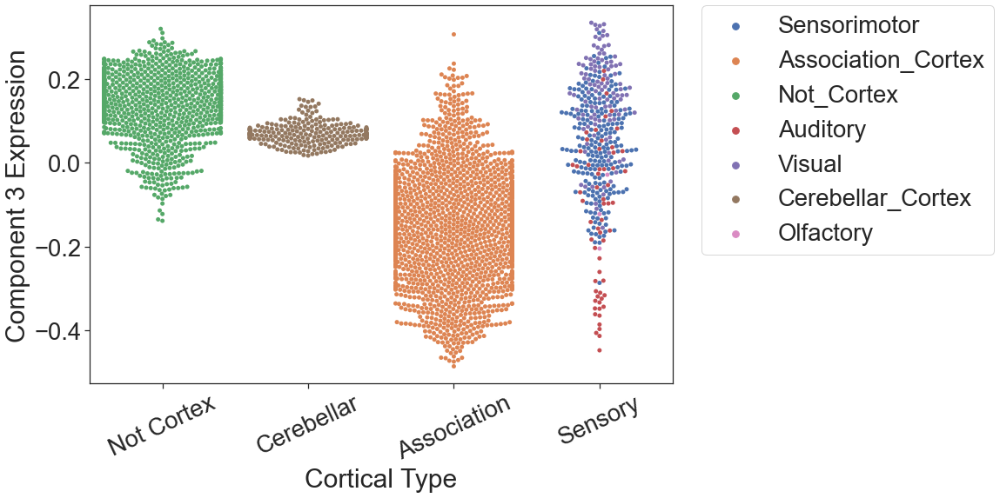

In [328]:
sns.set_context('notebook',font_scale=2.5)
plt.subplots(figsize=(12,8))
order = ['Not Cortex','Cerebellar_Cortex','Association_Cortex','Sensory']
g = sns.swarmplot(x='Cortical_Type', y='Component3_Expresion', 
              data=gdf, hue='Sensory_Type',order=order,
             )
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
g.set_xticklabels(['Not Cortex','Cerebellar','Association','Sensory'],
                  rotation=25)
plt.xlabel('Cortical Type')
plt.ylabel('Component 3 Expression')
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/C3_Modals.pdf',
           bbox_inches='tight')

In [355]:
for col in gdf.columns[-4:-1]:
    

Index(['Component1_Expresion', 'Component2_Expresion', 'Component3_Expresion'], dtype='object')

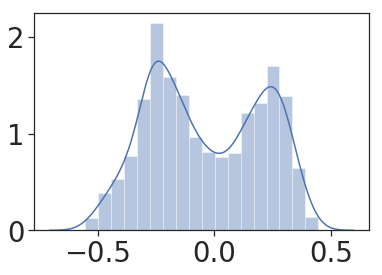

In [129]:
sns.distplot(c2_xp)

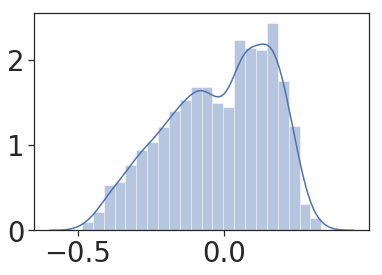

In [130]:
sns.distplot(c3_xp)

# Projection

In [21]:
pcamod = PCA(n_components=100, random_state=123).fit(bigdf)
sum(pcamod.explained_variance_ratio_)
pca_tfm = pandas.DataFrame(pcamod.transform(bigdf))
pls_mod = PLSRegression(n_components=3)
#full_y = gdf[['mni_nlin_y','mni_nlin_z','abs_mni_nlin_x']]
pls_mod.fit(pca_tfm, full_y)

NameError: name 'full_y' is not defined

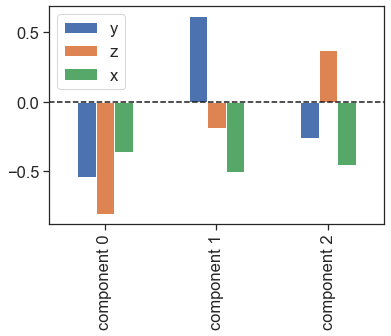

In [336]:
sns.set_context('notebook',font_scale=1.5)
pandas.DataFrame(pls_mod.y_weights_, 
                 index=['y','z','x'],
                 columns=['component %s'%x for x in range(3)]).T.plot.bar()
plt.axhline(0,c='k',ls='--')
plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/y_weights.pdf',
           bbox_inches='tight')

In [149]:
pls_mod.y_weights_[0]

array([-0.53740344,  0.62235325, -0.25007202])

In [150]:
pls_mod.y_weights_[0,:]

array([-0.53740344,  0.62235325, -0.25007202])

In [133]:
input_coords = []
for i,row in gdf.iterrows():
    input_coords.append(hap.convert_coords([round(int(row['mni_nlin_x'])), 
                                        round(int(row['mni_nlin_y'])), 
                                        round(int(row['mni_nlin_z']))], 'xyz'))
nm = 'NEUR608_IMG_c2'
mni_pth = '/home/users/jvogel/Science/templates/templates/MNI152_T1_1mm_brain.nii'
wdir = '/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/'
gcx_img = hap.make_expression_image(c2_xp, input_coords, mni_pth, wdir, nm, 5, return_img=True)

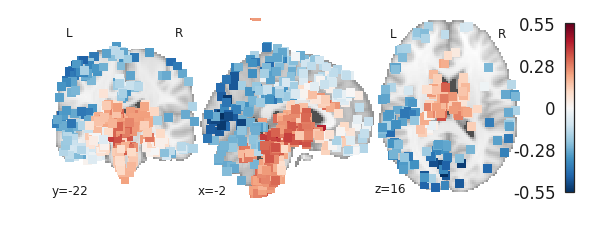

In [134]:
plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
                       cmap='RdBu_r',
                       draw_cross=False)
# plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C2_BrainGxp.pdf',
#             bbox_inches='tight')

In [ ]:
#gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C2_XWeights.nii.gz')

In [312]:
pls_mod.y_weights_

array([[-0.5380064 ,  0.61715419, -0.25645939],
       [-0.80515105, -0.18654157,  0.37379492],
       [-0.36072776, -0.50527673, -0.45182238]])

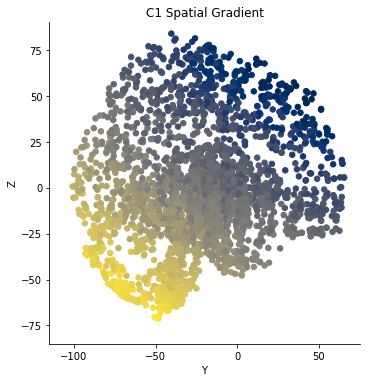

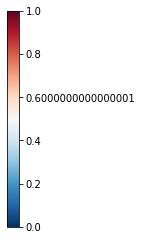

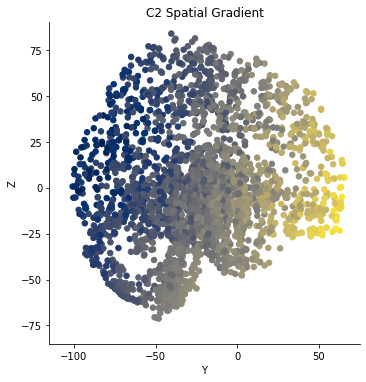

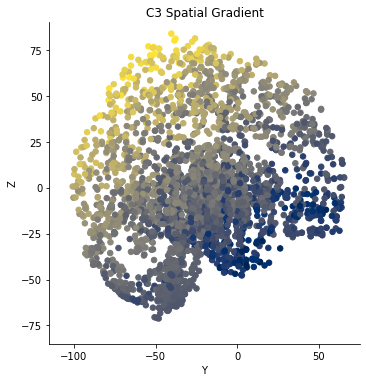

In [50]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.colors import Normalize

cmap = sns.color_palette('cividis',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    #sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    sg = np.dot(full_y.values,pls_mod.y_weights_[:,i])
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    gdf.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',  
                   data=gdf, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='magma')
    
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylim(-85,90)
    plt.xlim(-115,75)
    plt.xticks([-100,-50,0,50])
    plt.yticks(list(range(-75,76,25)))
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_SpatialC%s_YZ.pdf'%(i+1),
#                bbox_inches='tight')

    if i == 0:
    # colorbar
        a = np.array([[0,1]])
        #a = np.linspace(0,1,10)
        plt.figure(figsize=(.2, 5))
        img = plt.imshow(a, cmap="RdBu_r")
        plt.gca().set_visible(False)
        cax = plt.axes([0.1, 0.2, 0.8, 0.6])
        cbar = plt.colorbar(orientation="vertical", cax=cax)
        #newticks = [int(round(norm.inverse(x))) for x in cbar.get_ticks()]
        newticks = [norm.inverse(x) for x in cbar.get_ticks()]
        cbar.set_ticks(cbar.get_ticks())
        cbar.set_ticklabels(newticks)
#         plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_component_cbar.pdf',
#                    bbox_inches='tight')

        plt.show()




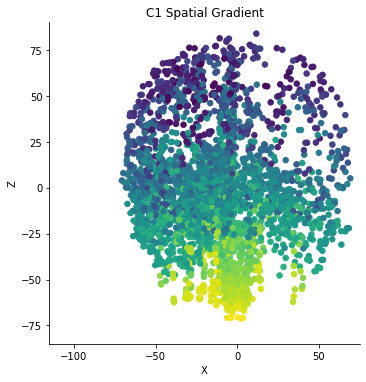

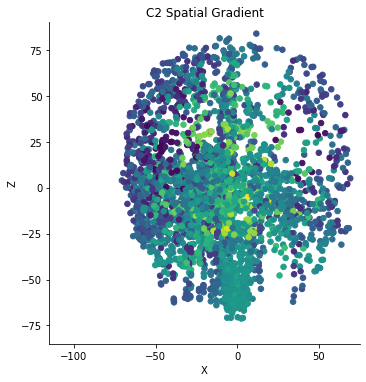

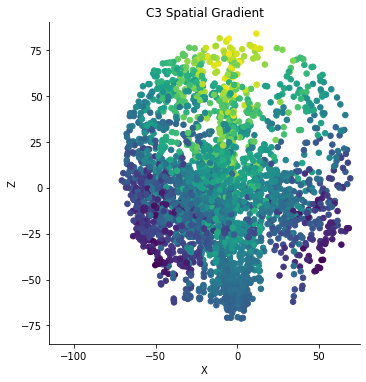

In [45]:
from sklearn.preprocessing import MinMaxScaler

cmap = sns.color_palette('viridis',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    sg = np.dot(full_y.values,pls_mod.y_weights_[:,i])
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    gdf.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_x', y='mni_nlin_z',  
                   data=gdf, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='viridis')
    
    plt.xlabel('X')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylim(-85,90)
    plt.xlim(-115,75)
    plt.xticks([-100,-50,0,50])
    plt.yticks(list(range(-75,76,25)))
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_SpatialC%s_XZ.pdf'%(i+1),
#                bbox_inches='tight')





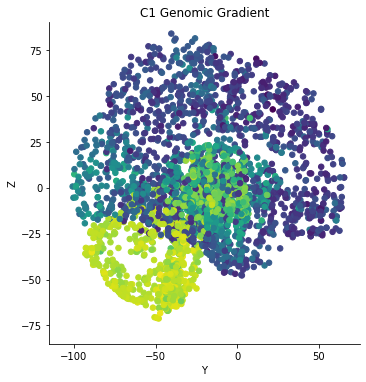

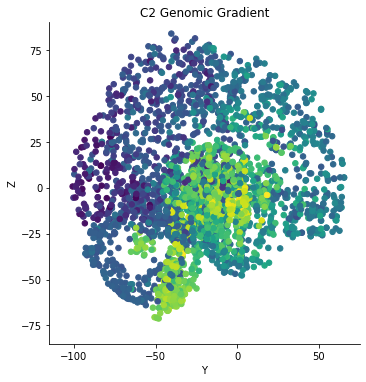

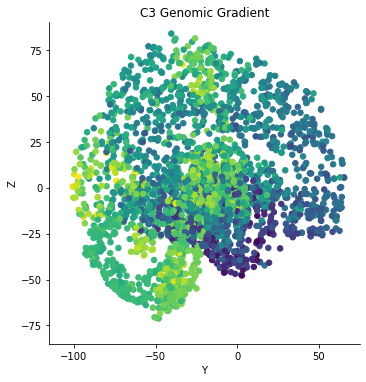

In [47]:
from sklearn.preprocessing import MinMaxScaler

cmap = sns.color_palette('viridis',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    #if i == 2:
    sg = gdf.loc[:,'Component%s_Expresion'%(i+1)].values
    #else:
    #    sg = -gdf.loc[:,'Component%s_Expresion'%(i+1)].values
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    norm = Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_y', y='mni_nlin_z',  
                   data=gdf, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='viridis')
    
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Genomic Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylim(-85,90)
    plt.xlim(-115,75)
    plt.xticks([-100,-50,0,50])
    plt.yticks(list(range(-75,76,25)))
#     plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_GenomicC%s_YZ.pdf'%(i+1),
#                bbox_inches='tight')



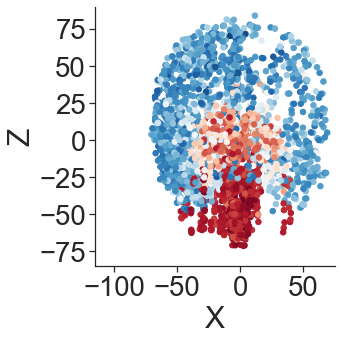

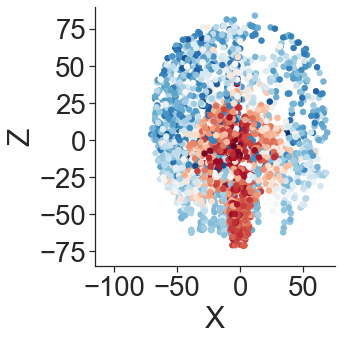

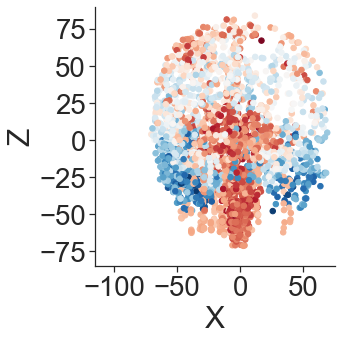

In [310]:
from sklearn.preprocessing import MinMaxScaler

cmap = sns.color_palette('RdBu_r',as_cmap=True)

for i in range(pls_mod.y_weights_.shape[0]):
    sg = gdf.loc[:,'Component%s_Expresion'%(i+1)].values
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    norm = matplotlib.colors.Normalize(vmin=np.min(scaled_sg), 
                                       vmax=np.max(scaled_sg))
    cscale = cmap(norm(scaled_sg))

    g = sns.lmplot(x='mni_nlin_x', y='mni_nlin_z',  
                   data=gdf, fit_reg=False, 
                   scatter_kws={"s": 30,'color':cscale},
                  palette='RdBu_r')
    
    plt.xlabel('X')
    plt.ylabel('Z')
#    plt.title('C%s Genomic Gradient'%(i+1))
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.ylim(-85,90)
    plt.xlim(-115,75)
    plt.xticks([-100,-50,0,50])
    plt.yticks(list(range(-75,76,25)))
    plt.savefig('/Users/jacobv/Science/PLS_GXP/txfer/ManuFigs/brain_plot_GenomicC%s_XZ.pdf'%(i+1),
               bbox_inches='tight')



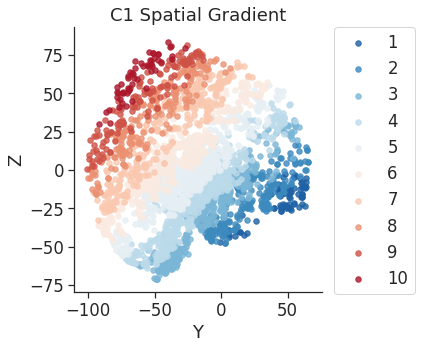

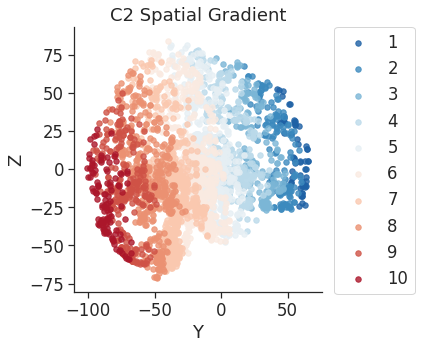

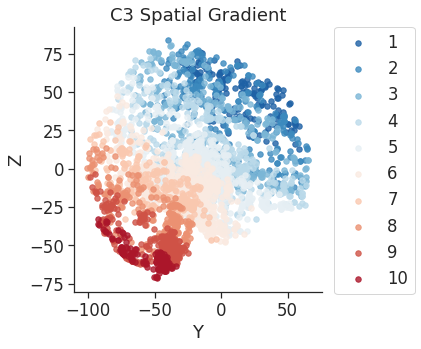

In [135]:
from sklearn.preprocessing import MinMaxScaler

for i in range(pls_mod.y_weights_.shape[0]):
    sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    gdf.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    cut = pandas.cut(scaled_sg,10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    gdf.loc[:,'C%s_SpatialGradient'%(i+1)] = [code[x] for x in cut]

    sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'C%s_SpatialGradient'%(i+1),legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C%s_BrainSpatialWB.pdf'%(i+1),
          bbox_inches='tight')
    plt.show()
    
#     gcx_img = hap.make_expression_image(#gdf['C%s_SpatialGradient'%(i+1)
#                                         #   ].values - 5.1,
#                                         sg,
#                                         input_coords, mni_pth, wdir, 
#                                         nm, 5, return_img=True)
#     plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
#                        cmap='RdBu_r',
#                        draw_cross=False)
    
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_BrainSpatial.pdf'%(i+1),
#                bbox_inches='tight')
#     plt.show()
#     gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_YWeights.nii.gz'%(i+1))

In [ ]:
from sklearn.preprocessing import MinMaxScaler

for i in range(pls_mod.y_weights_.shape[0]):
    sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    gdf.loc[:,'C%s_SmoothGradient'%(i+1)] = sg
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    cut = pandas.cut(scaled_sg,10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    gdf.loc[:,'C%s_SpatialGradient'%(i+1)] = [code[x] for x in cut]

    sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'C%s_SpatialGradient'%(i+1),legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/ManuFigs/C%s_BrainSpatialWB.pdf'%(i+1),
          bbox_inches='tight')
    plt.show()
    
#     gcx_img = hap.make_expression_image(#gdf['C%s_SpatialGradient'%(i+1)
#                                         #   ].values - 5.1,
#                                         sg,
#                                         input_coords, mni_pth, wdir, 
#                                         nm, 5, return_img=True)
#     plotting.plot_stat_map(gcx_img,cut_coords=[-2,-22,16],
#                        cmap='RdBu_r',
#                        draw_cross=False)
    
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_BrainSpatial.pdf'%(i+1),
#                bbox_inches='tight')
#     plt.show()
#     gcx_img.to_filename('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_YWeights.nii.gz'%(i+1))

(-81, 95)

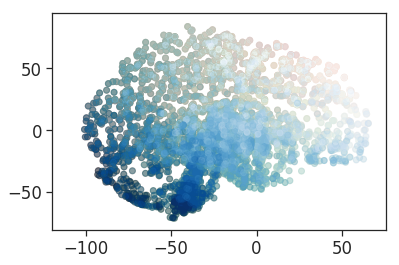

In [159]:
plt.scatter(gdf.mni_nlin_y.values,gdf.mni_nlin_z.values,
           c = gdf.C1_SpatialGradient.values,cmap='Reds',
           alpha=0.3)
plt.scatter(gdf.mni_nlin_y.values,gdf.mni_nlin_z.values,
           c = gdf.C2_SpatialGradient.values,cmap='Greens',
           alpha=0.3)
plt.scatter(gdf.mni_nlin_y.values,gdf.mni_nlin_z.values,
           c = gdf.C3_SpatialGradient.values,cmap='Blues',
           alpha=0.3)
plt.xlim(-120,76)
plt.ylim(-81,95)

In [137]:
code = dict(zip(range(1,11),
               [1,1,1,2,2,2,2,3,3,3]))
conversion = []
for i,row in gdf.iterrows():
    conversion.append('%s%s%s'%(code[row['C1_SpatialGradient']],
                          code[row['C2_SpatialGradient']],
                          code[row['C3_SpatialGradient']]))
code = dict(zip(np.unique(conversion),
               range(1,len(np.unique(conversion))+1)))
gdf.loc[:,'GradExp_Gp'] = [code[x] for x in conversion]

In [138]:
code

{'111': 1,
 '112': 2,
 '121': 3,
 '122': 4,
 '123': 5,
 '132': 6,
 '133': 7,
 '211': 8,
 '212': 9,
 '221': 10,
 '222': 11,
 '223': 12,
 '231': 13,
 '232': 14,
 '233': 15,
 '311': 16,
 '321': 17,
 '322': 18,
 '331': 19,
 '332': 20,
 '333': 21}

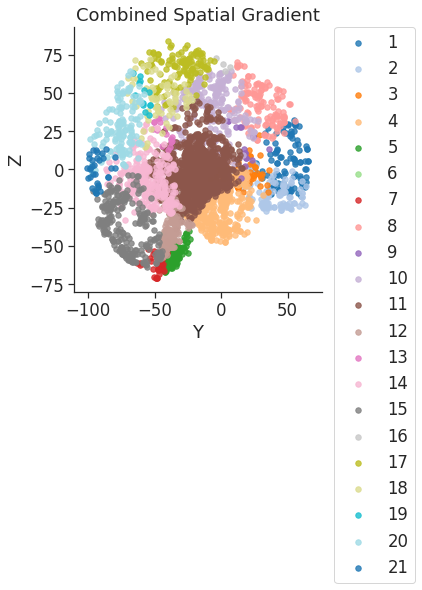

In [139]:
sns.set_context('notebook',font_scale=1.5)
sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'GradExp_Gp',legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='tab20')
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('Combined Spatial Gradient')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

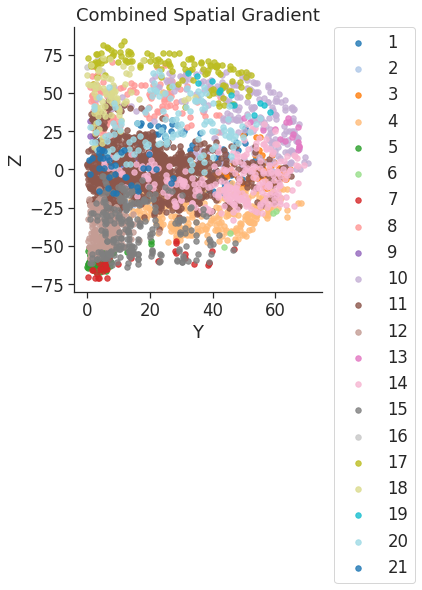

In [163]:
sns.lmplot('abs_mni_nlin_x', 'mni_nlin_z', 
               hue = 'GradExp_Gp',legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='tab20')
plt.xlabel('Y')
plt.ylabel('Z')
plt.title('Combined Spatial Gradient')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [173]:
gdf.Neural_Tube_segment.unique()

array(['Telencephalon', 'Meyelencephalon', 'Diencephalon',
       'Metencelphalon', 'Mesencephalon', nan], dtype=object)

In [184]:
pandas.crosstab(index=gdf[gdf.Neural_Tube_segment=='Telencephalon'].GradExp_Gp,
                columns=gdf[gdf.Neural_Tube_segment=='Telencephalon'].brain_divison)

brain_divison,Anterior_Cingulate,Forebrain,Frontal,Hypothalamus,Insula,Limbic,Occipital,Parietal,Posterior_Cingulate,Sensorimotor,Striatum,Temporal
GradExp_Gp,,,,,,,,,,,,
1,5,0,104,0,2,0,0,0,0,0,0,0
2,20,1,80,0,0,1,0,0,0,0,7,0
3,0,0,35,0,7,0,0,0,0,1,0,28
4,3,23,16,0,17,32,0,0,0,0,13,205
6,0,0,0,0,0,0,0,0,0,0,0,2
8,33,1,99,0,0,0,0,0,0,0,0,0
9,9,0,0,0,0,0,0,0,0,0,8,0
10,7,0,63,0,7,0,0,29,2,109,1,26
11,21,27,0,4,57,236,6,2,31,3,168,108


In [192]:
gdf[gdf.GradExp_Gp==19]['brain_divison'].value_counts()

Parietal    13
Name: brain_divison, dtype: int64

1: (Frontal)
2: (ACC), (Frontal)
3: ((Frontal)), ((Temporal))
4: (Forebrain),(Temporal)
5: Medulla
6: 
7: ((Cerebellum)),((Medulla))
8: (ACC), (Frontal)
9:
10: (Frontal),(Sensorimorot)
11: Midbrain, Thalamus, Hypothalamus, Other_Dien, Insula, Limbic, Striatum, (ACC), (Forebrain),(PCC),(Temporal)
12: Medulla, Pons
13:
14: (Occipital),(Temporal)
15: Cerebellum
16:
17: (Sensorimotor)
18: (Parietal),(PCC)
19: ((Parietal))
20: (Occipital),(Parietal)
21: (Occipital)

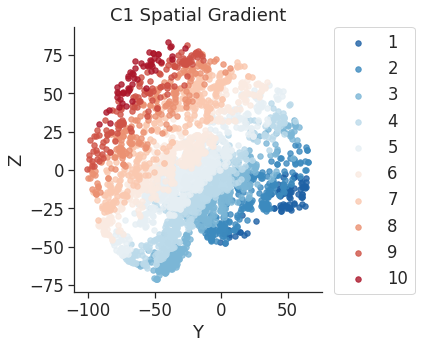

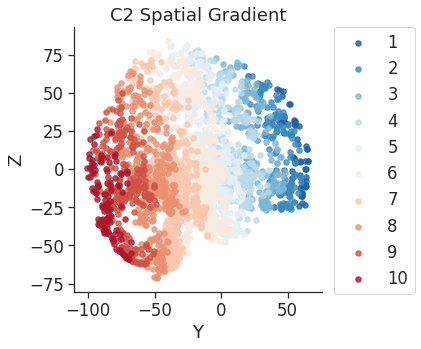

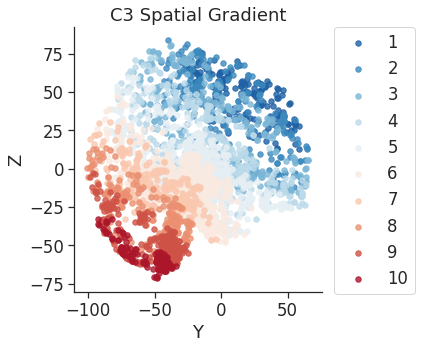

In [164]:
for i in range(pls_mod.y_weights_.shape[0]):
    sg = np.dot(full_y.values,pls_mod.y_weights_[i,:])
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    cut = pandas.cut(scaled_sg,10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    gdf.loc[:,'C%s_SpatialGradient'%(i+1)] = [code[x] for x in cut]

    sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'C%s_SpatialGradient'%(i+1),legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Spatial Gradient'%(i+1))
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
#     plt.savefig('/home/users/jvogel/Science/Allen_Human_Brain_Atlas/NEUR608/HBM/Figs/C%s_BrainSpatialWB.pdf'%(i+1),
#            bbox_inches='tight')
    plt.show()

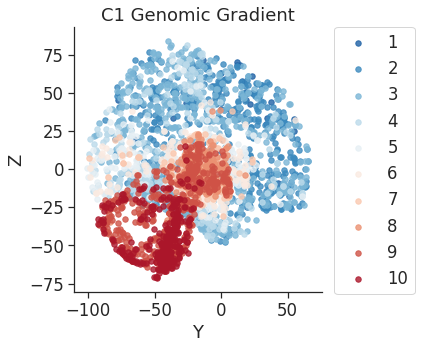

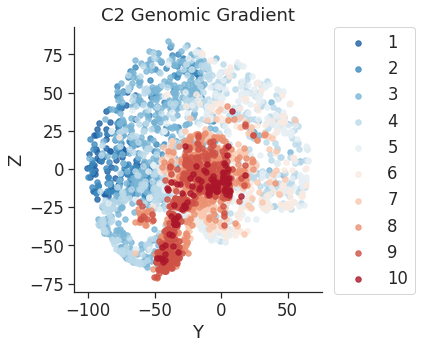

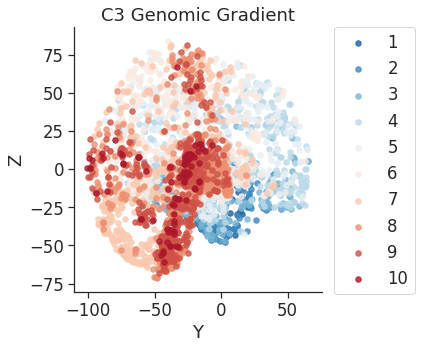

In [169]:
for i in range(pls_mod.y_weights_.shape[0]):
    sg = gdf.loc[:,'Component%s_Expresion'%(i+1)].values
    scaled_sg = MinMaxScaler().fit_transform(sg.reshape(-1,1))[:,0]
    cut = pandas.cut(scaled_sg,10)
    code = dict(zip(np.unique(cut),range(1,len(np.unique(cut))+1)))
    gdf.loc[:,'C%s_GCut'%(i+1)] = [code[x] for x in cut]

    sns.lmplot('mni_nlin_y', 'mni_nlin_z', 
               hue = 'C%s_GCut'%(i+1),legend=False, 
               data=gdf, fit_reg=False, 
               scatter_kws={"s": 30},
              palette='RdBu_r')
    plt.xlabel('Y')
    plt.ylabel('Z')
    plt.title('C%s Genomic Gradient'%(i+1))
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

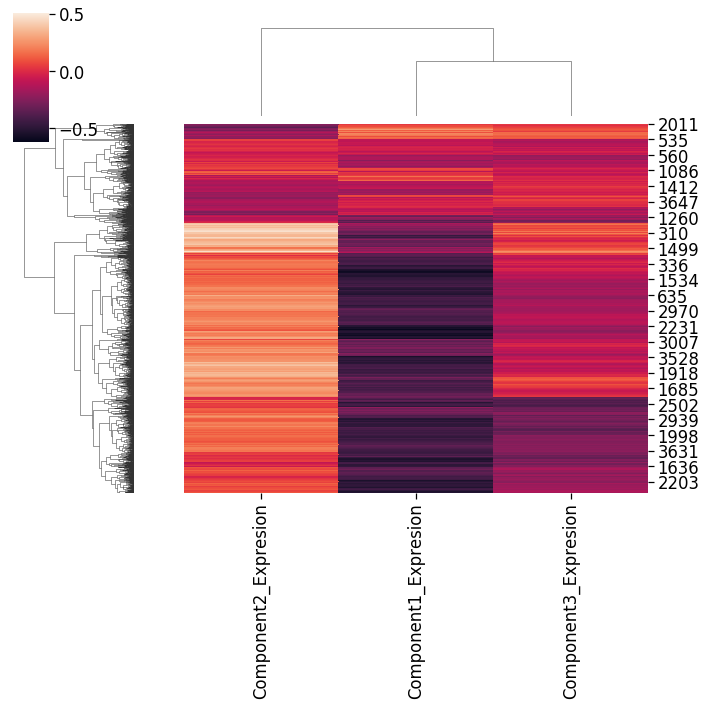

In [30]:
sns.clustermap(gdf[gdf.Neural_Tube_segment=='Telencephalon'
                  ][['Component1_Expresion',
                   'Component2_Expresion',
                   'Component3_Expresion']])

# For PNC analysis

In [25]:
cexp = pandas.DataFrame(index=gdf[gdf.columns[0]])
for i in range(3):
    cexp.loc[:,'C%s'%(i+1)] = np.dot(pca_tfm.values,
                                     pls_mod.x_weights_[:,i])

In [26]:
cexp.to_csv('/Users/jacobv/Science/PLS_GXP/PNC/Genomic_Component_Expression.csv')

# Monkey Evolution

In [34]:
refseq = pandas.read_csv('/Users/jacobv/Science/PLS_GXP/refseq_conversion.csv')
refseq = refseq[refseq.columns[:2]]
refseq.columns = ['rsid','gs']
pc2 = pandas.ExcelFile('/Users/jacobv/Science/PLS_GXP/media-8.xlsx')
pc2 = pc2.parse(pc2.sheet_names[0])
ncols = [] 
for i in range(len(pc2.columns)):
    cnm = pc2.loc[0,pc2.columns[i]]
    if i % 2 == 0:
        rnm = pc2.columns[i]
    else:
        rnm = pc2.columns[(i-1)]
    ncol = '%s_%s'%(rnm,cnm)
    ncols.append(ncol)
pc2.columns = ncols
pc2.drop(0,inplace=True)
pc2.head()

,PFC_Gene,PFC_PC2,HIP_Gene,HIP_PC2,CBL_Gene,CBL_PC2,V1_Gene,V1_PC2
1,NM_021025.3,0.138159,NM_021025.3,0.113917,XM_011534465.2,0.0979418,XR_001740009.1,0.128762
2,XR_001740009.1,0.136566,NM_001206480.2,0.102662,NM_001330533.1,0.095216,XM_011511497.2,0.09436
3,NM_001206480.2,0.125975,XM_011514541.1,0.0837236,NM_001206480.2,0.0935047,NM_002084.4,0.0937957
4,NM_002084.4,0.102506,XR_001740009.1,0.0818965,NM_006040.2,0.0930058,NM_001206480.2,0.091102
5,XM_011539454.2,0.0947831,XM_011510158.2,0.081318,NM_002899.3,0.0905976,XM_011539454.2,0.0856996


In [35]:
refseq.index = refseq.rsid.values
for i, row in pc2.iterrows():
    for reg in ['PFC','HIP','CBL','V1']:
        rsid = row['%s_Gene'%reg]
        xp = row['%s_PC2'%reg]
        refseq.loc[rsid,'%s_PC2'%reg] = xp

In [45]:
allcs = pandas.DataFrame(newc1,copy=True)
allcs.columns = ['C1','gene_symbol','gene_name']
allcs.loc[:,'C2'] = newc2[newc2.columns[0]].values
allcs.loc[:,'C3'] = newc3[newc3.columns[0]].values

In [91]:

for col in [x for x in refseq.columns if 'PC2' in x]:
    print('======%s======'%col)
    anlr = pandas.DataFrame(refseq[['gs',col]].dropna(),copy=True)
    anlr.index = anlr.gs.values[:]
    shared = list(set(anlr.index) & set(allcs.index))
    # address duplicates
    catch = []
    dups = []
    for i in anlr.index:
        if i not in catch:
            catch.append(i)
        else:
            print(i)
            dups.append(i)
    nvals = {}
    for dup in dups:
        nvals.update({dup:anlr.loc[dup,col].mean()})
    anlr.drop(dups,inplace=True)
    for dup,nval in nvals.items():
        anlr.loc[dup,col] = nval
        
    # correlation
    for i in range(1,4):
        r,p = stats.pearsonr(anlr.loc[shared,col],allcs.loc[shared,'C%s'%i])
        print('C%s: r = %s, p = %s'%(i,round(r,3),round(p,3)))


======PFC_PC2======
GTF3C3
MLLT3
RAB3B
TCF20
GABRA4
C1: r = -0.084, p = 0.119
C2: r = -0.028, p = 0.602
C3: r = -0.012, p = 0.824
======HIP_PC2======
GTF3C3
RAB3B
TCF20
GABRA4
C1: r = -0.059, p = 0.315
C2: r = -0.009, p = 0.881
C3: r = -0.049, p = 0.399
======CBL_PC2======
RAB3B
TCF20
C1: r = -0.043, p = 0.491
C2: r = 0.023, p = 0.713
C3: r = -0.078, p = 0.207
======V1_PC2======
GTF3C3
RAB3B
TCF20
GABRA4
C1: r = -0.06, p = 0.305
C2: r = -0.008, p = 0.888
C3: r = 0.033, p = 0.572


#### enrichment

In [96]:
len(allcs) * 0.008

125.06400000000001

In [97]:
(allcs.sort_values('C1').index.values)[:(round(len(allcs)*0.008))]

array(['CTXN3', 'FOXG1', 'TNNT2', 'WNT10A', 'MOXD1', 'ASGR2', 'GGTA1P',
       'OR14I1', 'KLHL29', 'NR2E1', 'ZBBX', 'GDA', 'PART1', 'TESPA1',
       'TEX29', 'ABHD12B', 'HDC', 'FREM3', 'LYPD8', 'GALNTL5', 'LCP2',
       'PRRX1', 'PCDH8', 'OSBPL3', 'LINC02217', 'SLC26A4-AS1', 'EMX2OS',
       'NEK11', 'BAIAP2L2', 'DLX1', 'OLFM4', 'EGR3', 'LINC01158',
       'ARHGAP25', 'GPR20', 'OTX1', 'NRGN', 'ADAMTS19', 'RXFP1', 'SNN',
       'LINC00982', 'ADTRP', 'ASB2', 'KCNV1', 'RTP1', 'NECAB1', 'COL5A2',
       'GDF10', 'OVOL2', 'LY86-AS1', 'PCDH10', 'TEX47', 'RASL10A', 'LHX2',
       'KCNMB4', 'LINC01140', 'FAM213A', 'FAM78A', 'GRID1', 'WFDC1',
       'VILL', 'DPF1', 'EMX2', 'SH2D5', 'KLHL25', 'PLCB1', 'MYO5B',
       'THEMIS', 'PCP4', 'BCL11B', 'EPHB6', 'C9orf24', 'DDAH1', 'CCDC173',
       'COL11A1', 'PRDM16', 'GPATCH4', 'ARX', 'PP12613', 'VWA3A',
       'PCDH20', 'CHRDL1', 'RABEPK', 'HSPH1', 'WIF1', 'CSRNP3', 'SLC26A4',
       'TMEM155', 'HTR1E', 'GAD1', 'FLRT1', 'KIF17', 'STOX1', 'MKL2',
    

In [106]:
ethr = 0.016
n_iter = 1000

dthr = ethr/2
prim_genes = refseq.gs.dropna().values
# enrichment
for i in range(1,4):
    # null
    nullset = []
    for it in range(n_iter):
        null = np.random.choice(allcs.index,round(len(allcs)*dthr))
        nullset.append(len(set(null) & set(prim_genes)))
    nullset = np.array(nullset)
    print('C%s_______'%i)
    nset = (allcs.sort_values('C%s'%i).index.values)[:(round(len(allcs)*dthr))]
    gset = set(prim_genes) & set(nset)
    p = (len(nullset[nullset>len(gset)]) + 1) / n_iter
    print(len(gset),'negatively enriched genes. P =',p,gset)
    pset = (allcs.sort_values('C%s'%i,ascending=False).index.values)[:(round(len(allcs)*dthr))]
    gset = set(prim_genes) & set(pset)
    p = (len(nullset[nullset>len(gset)]) + 1) / n_iter
    print(len(gset),'postively enriched genes. P =',p,gset)

C1_______
10 negatively enriched genes. P = 0.001 {'DDAH1', 'PRDM16', 'COL11A1', 'BCL11B', 'LCP2', 'IER5L', 'PRRX1', 'GDF10', 'WIF1', 'STOX1'}
2 postively enriched genes. P = 0.543 {'PDGFD', 'MAP2K6'}
C2_______
2 negatively enriched genes. P = 0.526 {'SMPX', 'RTKN2'}
6 postively enriched genes. P = 0.018 {'PTPRF', 'DNAAF4', 'PRRX1', 'TPPP3', 'AEBP1', 'GPX3'}
C3_______
5 negatively enriched genes. P = 0.06 {'ATP2B4', 'PCDH19', 'ADGRL3', 'NWD2', 'CEBPA'}
9 postively enriched genes. P = 0.001 {'ONECUT2', 'PCSK1', 'POU3F3', 'NEB', 'PRRX1', 'VWC2', 'CMYA5', 'CLMP', 'SYT2'}


In [108]:
len(prim_genes)

379

In [54]:
newc2.columns

Index([0, 'gene_symbol', 'gene_name'], dtype='object')

In [59]:
newc1.columns = ['C1','gene_symbol','gene_name']
newc1.loc[:,'C2'] = newc2[0].values
newc1.loc[:,'C3'] = newc3[0].values

In [64]:
newc1[newc1.gene_symbol.isin(['CD38','WDR6'])]

,C1,gene_symbol,gene_name,C2,C3
2100,-0.010851,CD38,CD38 molecule,0.018846,0.014293
14731,0.002019,WDR6,WD repeat domain 6,0.018293,-0.008519


In [84]:
newc1.to

,C1,gene_symbol,gene_name,C2,C3
0,0.001822,A1BG,alpha-1-B glycoprotein,0.003711,-0.022104
1,-0.006890,A1BG-AS1,NaN,-0.007837,-0.004443
2,0.004945,A2M,alpha-2-macroglobulin,0.008298,0.002382
3,-0.009122,A2ML1,alpha-2-macroglobulin-like 1,-0.004419,-0.007758
4,-0.001099,A3GALT2,NaN,0.001295,0.001691
...,...,...,...,...,...
15628,0.002159,ZXDC,ZXD family zinc finger C,0.010613,-0.004826
15629,-0.001805,ZYG11B,zyg-11 homolog B (C. elegans),-0.008147,-0.001765
15630,-0.001112,ZYX,zyxin,-0.016958,0.007325
15631,0.010725,ZZEF1,"zinc finger, ZZ-type with EF-hand domain 1",-0.003680,0.006823
